In [95]:
#!pip install --trusted-host pypi.org --trusted-host files.pythonhosted.org joblib

# **Project Name**    -  **Bicycle demand prediction based on weather conditions in Marseille (LEVELO)**

##### **Project Type**    - Regression
##### **Contribution**    - Individual

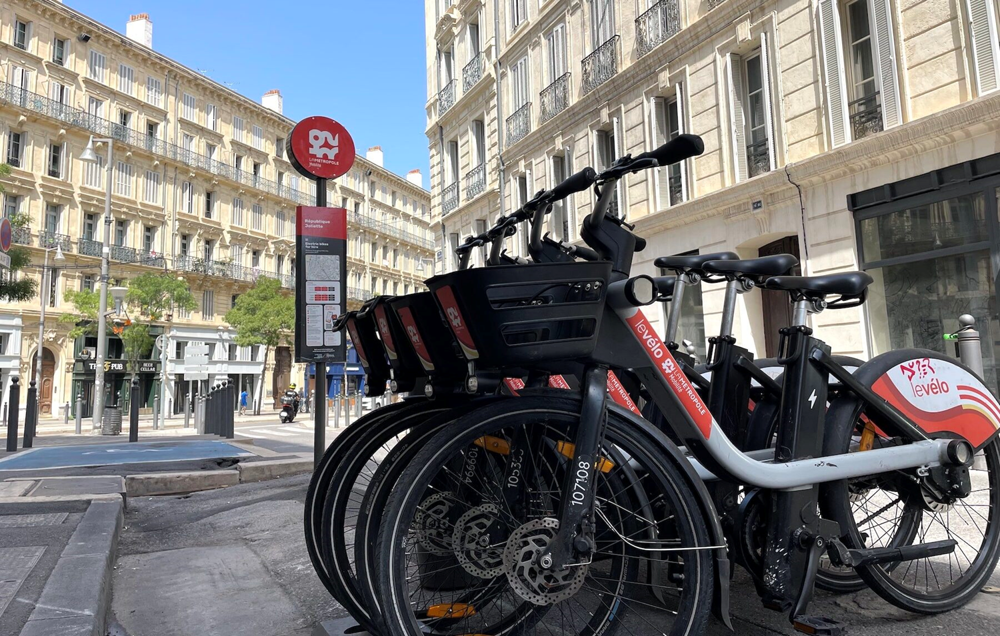

# **Project Summary -**

This project aims to improve mobility and the public experience through anticipatory bicycle rental programs in the city of Marseille. One of the main challenges facing the Aix-Marseille Metropolis today is to maintain a constant and spontaneous supply of transport for its inhabitants. It is in this context that, in addition to the various means of transport already in existence, it has set up the self-service bicycle system (Levélo). It's an excellent way of relieving the need for metropolitan dwellers to get around quickly, reducing congestion on the roads and at the same time having a very low environmental impact. Once these bikes have been adopted by the population, the challenge is to respond effectively to demand by making bikes available to users in the right place, at the right time and in the right quantity. As part of our work, we propose to provide a solution to this problem by predicting the demand for bicycles in the metropolis at an hourly frequency, according to meteorological and temporal variables. Based on weather forecasts for the city of Marseille, we will predict the number of bicycles that will be requested for rental.

* There were approximately 13107 records and 20 attributes in the dataset.
* We started by importing the dataset, and necessary libraries and conducted exploratory data analysis (EDA).
* Outliers and null values were removed from the raw data and treated. Data were transformed to ensure that it was compatible with machine learning models.
* We handled target class imbalance using square root normalization.
* Then finally cleaned and scaled data was sent to 11 various models, the metrics were made to evaluate the model, and we tuned the hyperparameters to make sure the right parameters were being passed to the model. 
* When developing a machine learning model, it is generally recommended to track multiple metrics because each one highlights distinct aspects of model performance. We are, focusing more on the R2 score and RMSE score. 
*  The R2 score is scale-independent, which means that it can be used to compare models that are fit to different target variables or to target variables that have different units of measurement. This is particularly useful when comparing models for different problems, as it allows for a direct comparison of the performance of the models, regardless of the scale of the target variable

# **Index**

1.   Problem Statement
2.   Know Your Data
3.   Understanding Your Variables
4.   EDA
5.   Data Cleaning
6.   Feature Engineering
7.   Model Building
8.   Model Implementaion.
9.   Conclusion

# **Let's Begin !**

## **1. Problem Statement**

Many metropolitan areas now offer bike rental to enhance mobility and convenience. Ensuring fast access to rental bikes is essential to reduce waiting times for the public, which makes the regular supply of rental bikes a major concern. Hourly bicycle counting is particularly important in this respect. 

Bike-share systems automate the registration, rental and return of bikes via a network of locations. People can rent bikes at one location and return them at another or the same location, depending on their needs, hence the idea of anticipating demand to better serve users.

This dataset aims to predict demand for Marseille's bike-share program based on usage history, weather parameters and other variables we felt were relevant.

### **Business Context** 

Estimating the number of bikes needed at a given time, on a given day, is a key concern for optimization purposes. Having fewer bikes means wasting resources (in terms of bike maintenance and parking fleets). At the same time, having many more bikes can lead to a loss of revenue, ranging from an immediate loss due to fewer customers to a potential long-term loss due to a loss of future customers. 
It's also possible to imagine that extremely hot weather would cause a huge drop in bicycle use. If this proves to be the case, it may be a good idea to play on this demand to develop management and scheduling policies for the agents responsible for replenishing the stations. In short, it's quite essential for the city to have an estimate of demand in order to operate efficiently and improve its user experience.

## **2. Know Your Data**

### Import Libraries

In [96]:
# Import Libraries and modules

# libraries that are used for analysis and visualization
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import missingno as msno

# to import datetime library
from datetime import datetime
import datetime as dt

# libraries used to pre-process
from sklearn import preprocessing, linear_model
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import OneHotEncoder
from sklearn.model_selection import train_test_split

# libraries used to implement models
from sklearn.linear_model import LinearRegression, Ridge, Lasso, ElasticNet
from sklearn.neighbors import KNeighborsRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor, ExtraTreesRegressor, GradientBoostingRegressor, AdaBoostRegressor
from sklearn.svm import SVR
from xgboost import XGBRegressor
from lightgbm import LGBMRegressor
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV

# libraries to evaluate performance
from sklearn import metrics
from sklearn.metrics import mean_squared_error, r2_score, accuracy_score, mean_absolute_error
import joblib

# Library of warnings would assist in ignoring warnings issued
import warnings
warnings.filterwarnings('ignore')

# to set max column display
pd.pandas.set_option('display.max_columns',None)

### Dataset Loading

In [97]:
Dataset = r"C:\Users\39812\OneDrive - Aix Marseille Provence Métropole\Documents\Bike Project\Datasets\Bike_df.csv"
bike_df = pd.read_csv(Dataset)
bike_df.head()

,Dates,Year,Month,Day,Hour,Rented Bike Count,RR1,FF,DD,FXI,T,TD,U,DHUMI80,TSV,VV,GLO,weekday,Seasons,Holiday
0,2023-01-01,2023,1,1,0,52,0.0,3.8,100.0,10.5,13.4,10.8,84.0,60.0,12.9,34060.0,0.0,Sunday,Hiver,Public Holiday
1,2023-01-01,2023,1,1,1,55,0.0,3.8,80.0,9.4,13.6,10.8,83.0,60.0,12.9,39322.0,0.0,Sunday,Hiver,Public Holiday
2,2023-01-01,2023,1,1,2,58,0.0,3.8,100.0,8.1,13.9,10.6,81.0,60.0,12.8,39468.0,0.0,Sunday,Hiver,Public Holiday
3,2023-01-01,2023,1,1,3,77,0.0,5.0,90.0,10.8,14.0,10.8,81.0,60.0,12.9,38313.0,0.0,Sunday,Hiver,Public Holiday
4,2023-01-01,2023,1,1,4,43,0.0,5.3,100.0,11.7,14.4,11.2,81.0,60.0,13.3,41397.0,0.0,Sunday,Hiver,Public Holiday


### Dataset Rows & Columns Count

In [98]:
# Dataset Rows & Columns 
bike_df.shape

(13779, 20)

In [99]:
print(f'number of rows : {bike_df.shape[0]}  \nnumber of columns : {bike_df.shape[1]}')

number of rows : 13779  
number of columns : 20


### Dataset Information

In [100]:
# Dataset Info
bike_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13779 entries, 0 to 13778
Data columns (total 20 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   Dates              13779 non-null  object 
 1   Year               13779 non-null  int64  
 2   Month              13779 non-null  int64  
 3   Day                13779 non-null  int64  
 4   Hour               13779 non-null  int64  
 5   Rented Bike Count  13779 non-null  int64  
 6   RR1                13779 non-null  float64
 7   FF                 13779 non-null  float64
 8   DD                 13779 non-null  float64
 9   FXI                13779 non-null  float64
 10  T                  13779 non-null  float64
 11  TD                 13779 non-null  float64
 12  U                  13779 non-null  float64
 13  DHUMI80            13779 non-null  float64
 14  TSV                13779 non-null  float64
 15  VV                 13779 non-null  float64
 16  GLO                137

We have 20 columns. most of them are numerical except Seasons, School Holiday, weekday, and Date

We have to convert the Date column into the DateTime datatype.

### Duplicate Values

**How important is it to get rid of duplicate records in my data?**

When there are identical instances in a dataset, it is referred to as "duplication." Such duplication could occur due to erroneous data entry or data collection procedures. Eliminating duplicate data from the dataset saves time and money by avoiding the repetition of the same data sent to the machine learning model.

In [101]:
# Dataset Duplicate Value Count
# Checking Duplicate Values
value = len(bike_df[bike_df.duplicated()])
print("The number of duplicate values in the data set is = ",value)

The number of duplicate values in the data set is =  0


We found that there is no duplicate entry in the above data.

### Missing Values/Null Values

**Why dealing with missing values is necessary?**

Real-world data often contains numerous missing values, which can be due to data corruption or other factors. As many machine-learning algorithms do not support missing values, it is necessary to handle them during the dataset pre-processing stage. Thus, the first step in dealing with missing data is to identify the missing values.

In [102]:
# Missing Values/Null Values Count
print(bike_df.isnull().sum())

Dates                0
Year                 0
Month                0
Day                  0
Hour                 0
Rented Bike Count    0
RR1                  0
FF                   0
DD                   0
FXI                  0
T                    0
TD                   0
U                    0
DHUMI80              0
TSV                  0
VV                   0
GLO                  0
weekday              0
Seasons              0
Holiday              0
dtype: int64


<Axes: >

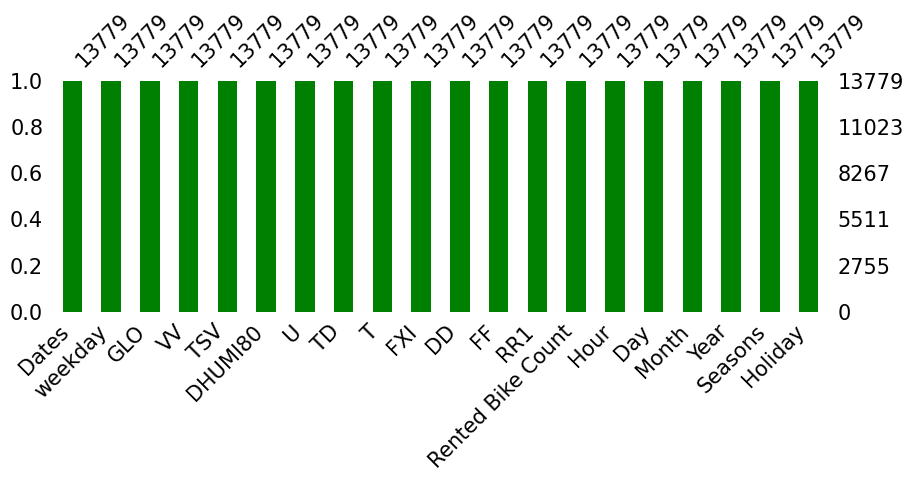

In [103]:
# Visualizing the missing values
import missingno as msno
msno.bar(bike_df, color='green',sort='ascending', figsize=(10,3), fontsize=15)

<Axes: >

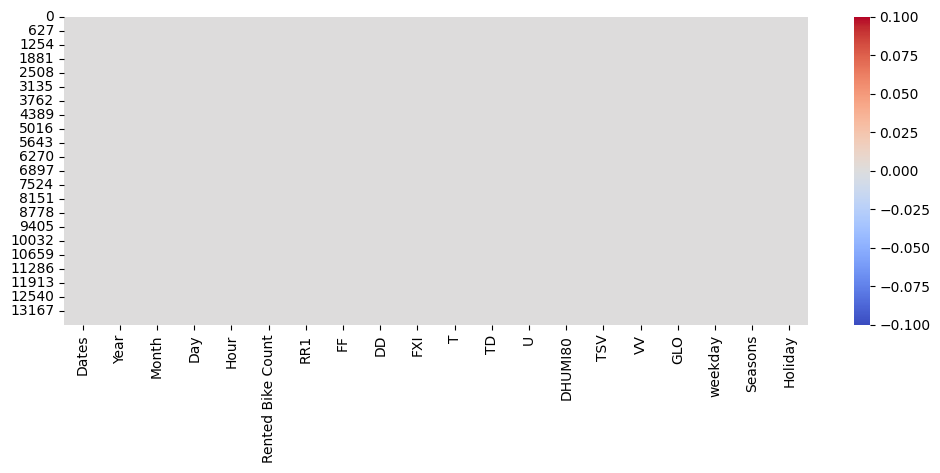

In [104]:
# Visualizing the missing values using Heatmap
plt.figure(figsize=(12,4))
sns.heatmap(bike_df.isna(), cmap = 'coolwarm')

From the above command, we noticed that every column has 0 null values. This seems to be clean data and there is no missing data in any of the rows and columns.

### What did you know about your dataset?

The dataset provided contains 20 columns and 11738 rows and does not have any missing or duplicate values.

The aim is to use this dataset to predict weather-related demand from bike users in the metropolis. Demand prediction involves analytical studies on the likelihood of a customer using bike rental services, with the aim of understanding and managing the balance between supply and demand throughout the day.

## **3. Understanding Your Variables**

###  Columns

In [105]:
# Dataset Columns
bike_df.columns

Index(['Dates', 'Year', 'Month', 'Day', 'Hour', 'Rented Bike Count', 'RR1',
       'FF', 'DD', 'FXI', 'T', 'TD', 'U', 'DHUMI80', 'TSV', 'VV', 'GLO',
       'weekday', 'Seasons', 'Holiday'],
      dtype='object')

### variable renaming 

In [106]:
#Rennomage des colonnes 
bike_df = bike_df.rename(columns={
    'Dates' : 'dates',
    'Month' : 'month',
    'Year' : 'year',
    'Day' : 'day',
    'Hour': 'hour',
    'RR1' : 'rainfall',
    'Rented Bike Count' : 'rented_bike_count',
    'FF' : 'wind_speed',
    'FXI' : 'inst_wind_speed_min',
    'DD' : 'wind_direction',
    'T' : 'temperature',
    'TD' : 'dew_point_temperature',
    'TSV' : 'steam_pressure',
    'U' : 'humidity',
    'DHUMI80' : 'humidity_duration',
    'VV' : 'visibility',
    'GLO' : 'solar_radiation',
    'Holiday' : 'holiday',
    'Seasons' : 'seasons'
})

bike_df.head()

,dates,year,month,day,hour,rented_bike_count,rainfall,wind_speed,wind_direction,inst_wind_speed_min,temperature,dew_point_temperature,humidity,humidity_duration,steam_pressure,visibility,solar_radiation,weekday,seasons,holiday
0,2023-01-01,2023,1,1,0,52,0.0,3.8,100.0,10.5,13.4,10.8,84.0,60.0,12.9,34060.0,0.0,Sunday,Hiver,Public Holiday
1,2023-01-01,2023,1,1,1,55,0.0,3.8,80.0,9.4,13.6,10.8,83.0,60.0,12.9,39322.0,0.0,Sunday,Hiver,Public Holiday
2,2023-01-01,2023,1,1,2,58,0.0,3.8,100.0,8.1,13.9,10.6,81.0,60.0,12.8,39468.0,0.0,Sunday,Hiver,Public Holiday
3,2023-01-01,2023,1,1,3,77,0.0,5.0,90.0,10.8,14.0,10.8,81.0,60.0,12.9,38313.0,0.0,Sunday,Hiver,Public Holiday
4,2023-01-01,2023,1,1,4,43,0.0,5.3,100.0,11.7,14.4,11.2,81.0,60.0,13.3,41397.0,0.0,Sunday,Hiver,Public Holiday


###  Statistical Summary

In [107]:
# Dataset Describe
bike_df.describe(include='all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
dates,13779,577,2023-01-01,24,NaN,NaN,NaN,NaN,NaN,NaN,NaN
year,13779.0,NaN,NaN,NaN,2023.389506,0.487656,2023.0,2023.0,2023.0,2024.0,2024.0
month,13779.0,NaN,NaN,NaN,5.611946,3.253414,1.0,3.0,5.0,8.0,12.0
day,13779.0,NaN,NaN,NaN,15.69635,8.84049,1.0,8.0,16.0,23.0,31.0
hour,13779.0,NaN,NaN,NaN,11.519849,6.917716,0.0,6.0,12.0,18.0,23.0
rented_bike_count,13779.0,NaN,NaN,NaN,359.239422,299.637227,1.0,97.0,303.0,539.0,1710.0
rainfall,13779.0,NaN,NaN,NaN,0.060897,0.506797,0.0,0.0,0.0,0.0,19.0
wind_speed,13779.0,NaN,NaN,NaN,2.120357,1.557167,0.0,0.9,1.9,3.2,8.9
wind_direction,13779.0,NaN,NaN,NaN,184.219464,106.390959,0.0,90.0,240.0,280.0,360.0
inst_wind_speed_min,13779.0,NaN,NaN,NaN,5.82228,3.781253,0.0,2.7,5.0,8.0,23.6


###  Variables Description

The dataset contains weather information (Temperature, Dewpoint temperature, Steam pressure,  Humidity, Humidity duration,  Windspeed, wind direction, Visibility, instantaneous wind force,  Solar radiation, Rainfall), the number of bikes rented per hour and date information.

<b>Attribute Information: </b>

**date** : **year-month-day**

**weekday** : **day of week**

**rented_bike_count** : **Count of bikes rented at each hour**

**hour** : **Hour of the day**

**temperature** : **Temperature in Celsius and 1/10**

**dew_point_temperature** : **Dew point temperature in Celsuis and 1/10** 

**steam_pressure** : **vapour pressure in hPa and 1/10**

**humidity** : **relative humidity in %**

**humidity_duration** : **duration with humidity at 80% in mm**

**windspeed** : **wind force measured at 10 meters in m/s and 1/10**

**wind_direction** : **wind direction in 360° rose**

**inst_wind_speed_min** : **maximum instantaneous wind force per hour, measured at 10 meters in m/s and 1/10**

**visibility** : **visibility in mm**

**solar_radiation** : **global solar radiation in j/cm2**

**rainfall** : **amount of precipitation in 1 hour in mm and 1/10**

**seasons** : **Winter, Spring, Summer, Autumn**

**holiday** : **Public Holiday/No holiday**

In [108]:
# print the unique value
bike_df.nunique()

dates                      577
year                         2
month                       12
day                         31
hour                        24
rented_bike_count         1291
rainfall                    51
wind_speed                  83
wind_direction              37
inst_wind_speed_min        211
temperature                400
dew_point_temperature      229
humidity                    87
humidity_duration           61
steam_pressure             257
visibility               11211
solar_radiation            357
weekday                      7
seasons                      4
holiday                      2
dtype: int64

## **4. EDA**

#### **What is EDA?**
* Exploratory Data Analysis (EDA) is a critical step in the data science process that involves analyzing and understanding the data. The primary objective of EDA is to gain insights into the data, uncover patterns, and detect relationships and trends. This iterative process helps identify outliers, missing values, and other issues that may impact the analysis and modeling of the data.

In [109]:
bike_df.hour.unique()

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
       17, 18, 19, 20, 21, 22, 23], dtype=int64)

The hours of the day follow a clear sequence, so this is a discrete cardinal variable (hour). We'll consider the hour as a categorical value (Session of the day) and transform it into a numerical value later to see if this makes a difference in the results.

In [110]:
def session(x):

    '''
    For exploratory data analysis (EDA) purposes, the "Hour" column can be converted into categorical variables
    such as "Morning", "Noon", and "Night", without altering the existing label encoding format of the "Hour" column.
    This conversion is not necessary for model training.
    '''

    if x>4 and x<=8:
        return 'Early Morning'
    elif x>8 and x<=12:
        return 'Morning'
    elif x>12 and x<=16:
        return 'Afternoon'
    elif x>16 and x<=20:
        return 'Evening'
    elif x>20 and x<=24:
        return 'Night'
    elif x<=4:
        return 'Late Night'

#apply funtion to make new category column
bike_df['session'] = bike_df['hour'].apply(session)

### **4.1 Column: 'rented_bike_count'**

In [111]:
print(f'Min Count: {bike_df.rented_bike_count.min()}')
print(f'Max Count: {bike_df.rented_bike_count.max()}')

Min Count: 1
Max Count: 1710


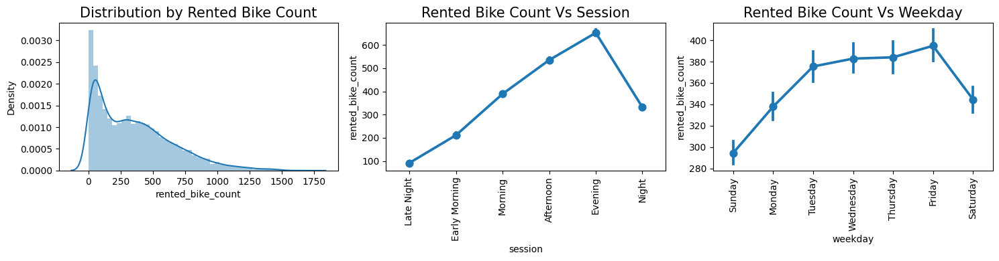

In [112]:

fig,ax = plt.subplots(1,3, figsize=(15,4))

# Distribution analysis
dist = sns.distplot(bike_df['rented_bike_count'], ax=ax[0])
dist.set_title('Distribution by Rented Bike Count', size=15)

# Bi-variate analysis
# Rented Bike Count Vs Session
point = sns.pointplot(data=bike_df, x='session', y='rented_bike_count', ax=ax[1])
point.set_title('Rented Bike Count Vs Session', size=15)
# Set x-ticks rotation to 90 degrees
point.set_xticklabels(point.get_xticklabels(), rotation=90)

# Bi-variate analysis
# Rented Bike Count Vs Weekday
point = sns.pointplot(data=bike_df, x='weekday', y='rented_bike_count', ax=ax[2])
point.set_title('Rented Bike Count Vs Weekday', size=15)
# Set x-ticks rotation to 90 degrees
plt.xticks(rotation=90)

plt.tight_layout()
plt.show()

**Observation:**

* Distribution of Rented Bike Count is positively skewed and has many outliers. We will treat it later.
* Demand for rented bikes increases in the evening.
* Demand for rental bikes is lowest on Sundays, and highest on Fridays.

### **4.2.1 Column: 'hour'**

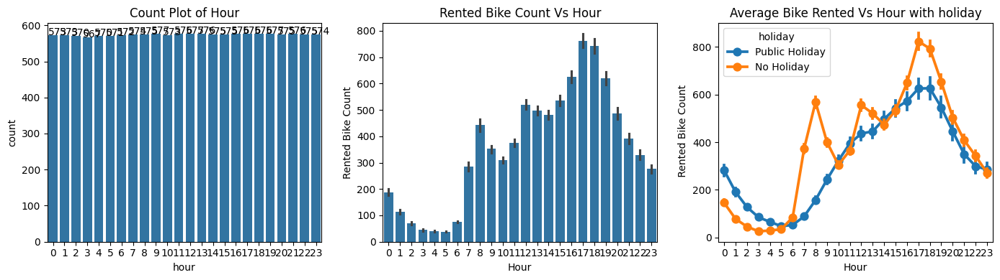

In [113]:
fig,ax = plt.subplots(1,3, figsize=(14,4))

# Univariate analysis
count = sns.countplot(data=bike_df, x='hour', ax=ax[0])
count.set_title('Count Plot of Hour')

# adding value count on the top of bar
for p in count.patches:
    count.annotate(format(p.get_height(), '.0f'), (p.get_x(), p.get_height()))

# Bi-variate analysis
# Rented Bike Count Vs Hour
bar = sns.barplot(data=bike_df, x='hour', y='rented_bike_count', ax = ax[1])
bar.set(xlabel='Hour', ylabel='Rented Bike Count', title='Rented Bike Count Vs Hour')

# Multi-variate analysis
point = sns.pointplot(data=bike_df, x='hour', y='rented_bike_count', hue='holiday', ax= ax[2])
point.set(xlabel='Hour', ylabel = ' Rented Bike Count', title='Average Bike Rented Vs Hour with holiday')

plt.tight_layout()
plt.show()

**Observation:**

* Each hour has virtually an equal number of counts in the dataset.
* Demand for bike hire reaches its first peak at 8 a.m. and drops until it reaches virtually the same peak again at 12 p.m.. Demand then remains fairly stable until reaching its third, much higher peak at 5pm. This could be an indication of strong demand during the commuting hours(including breaks).
* Rented Bike Count follows 2 patterns one for holiday and another for no holiday.
* working days : Demand for bike rentals reaches its first peak at 8 a.m. we then observe a drop which is followed again by a peak at noon, practically at the same level as that at 8 o'clock. Demand then remains relatively stable until reaching its third, much higher peak at 5 p.m. This could indicate high demand during business hours (including breaks).
* Public holidays: In the first model, demand for bike rentals increases positively and fairly gradually, with a peak at 5 pm. This could correspond mainly to likely tourists who are generally occasional users who rent/deposit bikes regularly throughout the day and visit the city on non-working days, which are generally Saturdays and Sundays.

### **4.2.2 Column hour [Rented Bike vs subway stop (9 p.m.)]**

### Since November 6, 2023, Métropole has decided to stop subway service at 9:30 pm on Mondays and Thursdays.
### We will try to assess the impact of this change on demand for bicycles by observing the average number of bicycles rented from 2pm to 4am for a period of one month before and after November 6, 2023 (in order to avoid an analysis biased by climate and seasons).

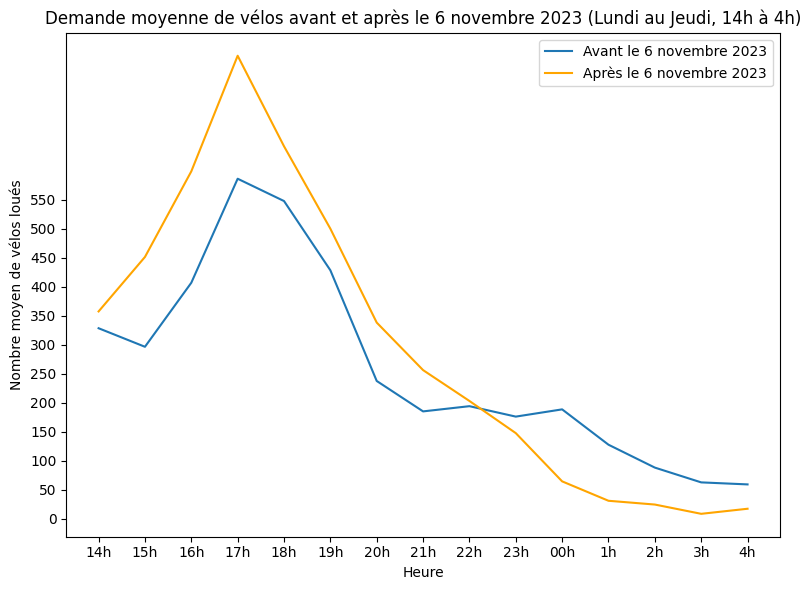

,adjusted_hour,hours,befeor_rented_bike_count,after_rented_bike_count
0,-10,14h,328.5,357.50
1,-9,15h,296.5,451.50
2,-8,16h,407.0,599.25
3,-7,17h,586.5,798.75
4,-6,18h,548.0,642.50
5,-5,19h,428.5,500.25
6,-4,20h,237.5,338.25
7,-3,21h,185.0,256.25
8,-2,22h,194.0,203.00
9,-1,23h,176.0,147.50


In [114]:
# Filtrer les données entre le 6 octobre 2023 et le 6 décembre 2023
start_date = pd.to_datetime('2023-11-01')
end_date = pd.to_datetime('2023-11-11')
bike_df['dates'] = pd.to_datetime(bike_df['dates'])
filtered_df = bike_df[(bike_df['dates'] >= start_date) & (bike_df['dates'] <= end_date)]

# Filtrer les jours du lundi au jeudi
filtered_df = filtered_df[filtered_df['weekday'].isin(['Monday', 'Tuesday', 'Wednesday', 'Thursday'])]

# Séparer les données avant et après le 6 novembre 2023
date_threshold = pd.to_datetime('2023-11-06')

before_df = filtered_df[filtered_df['dates'] < date_threshold]
after_df = filtered_df[filtered_df['dates'] >= date_threshold]

# Filtrer les heures de 21h à 1h
before_night_df = before_df[(before_df['hour'] >= 14) | (before_df['hour'] < 5)]
after_night_df = after_df[(after_df['hour'] >= 14) | (after_df['hour'] < 5)]

# Corriger l'heure pour rendre les heures consécutives
before_night_df['adjusted_hour'] = before_night_df['hour'].apply(lambda x: x if x < 5 else x - 24)
after_night_df['adjusted_hour'] = after_night_df['hour'].apply(lambda x: x if x < 5 else x - 24)

# Agréger les données pour obtenir la moyenne sur les heures spécifiées
before_agg = before_night_df.groupby('adjusted_hour')['rented_bike_count'].mean().reset_index()
after_agg = after_night_df.groupby('adjusted_hour')['rented_bike_count'].mean().reset_index()

# Tracer les graphes comparatifs sur le même axe
fig, ax = plt.subplots(figsize=(8, 6))

# Graphique des demandes de vélos avant le 6 novembre 2023
sns.lineplot(data=before_agg, x='adjusted_hour', y='rented_bike_count', ax=ax, label='Avant le 6 novembre 2023')

# Graphique des demandes de vélos après le 6 novembre 2023 en orange
sns.lineplot(data=after_agg, x='adjusted_hour', y='rented_bike_count', ax=ax, label='Après le 6 novembre 2023', color='orange')

# Configuration des axes
ax.set_title('Demande moyenne de vélos avant et après le 6 novembre 2023 (Lundi au Jeudi, 14h à 4h)')
ax.set_xlabel('Heure')
ax.set_ylabel('Nombre moyen de vélos loués')
ax.set_xticks([-10, -9, -8, -7, -6, -5, -4, -3, -2, -1, 0, 1, 2, 3, 4], ['14h', '15h', '16h', '17h', '18h', '19h', '20h', '21h', '22h', '23h', '00h', '1h', '2h', '3h', '4h'])
ax.set_yticks([0, 50, 100, 150, 200, 250, 300, 350, 400, 450, 500, 550])

# Ajouter une légende
ax.legend()

plt.tight_layout()
plt.show()

# Ajouter une colonne pour indiquer la période (avant ou après)
before_agg.rename(columns={'rented_bike_count' : 'befeor_rented_bike_count'}, inplace=True)
after_agg.rename(columns={'rented_bike_count' : 'after_rented_bike_count'}, inplace=True)

# Combiner les deux DataFrames
combined_agg = pd.merge(before_agg, after_agg, on=['adjusted_hour'], how = 'inner')
hourss = ['14h', '15h', '16h', '17h', '18h', '19h', '20h', '21h', '22h', '23h', '00h', '1h', '2h', '3h', '4h']
combined_agg['hours'] = hourss
cols = list(combined_agg.columns)
cols.insert(1, cols.pop(cols.index('hours')))
combined_agg = combined_agg[cols]
combined_agg

**Observation:**

* There was a noticeable increase in the number of bikes rented in the evening, the week after the metro shutdown, reaching a peak of 798 bikes rented at 5pm, an increase of 200 bikes on the previous week. This trend shows that demand remains higher in the evening, until 10 p.m. in the week following the metro shutdown. Thereafter, rentals decline from the time the metro closes, reaching a low point with 124 fewer bikes at midnight compared with the week before the shutdown.

* This significant increase in the evening can be attributed to users anticipating the closure of the metro, preferring to get off work earlier. It could therefore be hypothesized that, in order to get around, many users first use bicycles to get to the metro stations. In other words, the fact that the metro closes at 9:30 p.m. means that bikes are used earlier in the day to get to stations.

### **4.3 Column: 'temperature'**

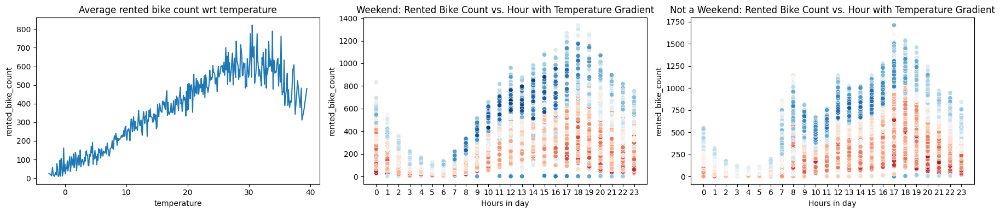

In [115]:
fig,ax = plt.subplots(1,3, figsize=(18,4))

# Univariate analysis
# Dependent Column Value Vs temperature
# group temperature column
temp_wrt_bike_rent_count = bike_df.groupby(['temperature'])['rented_bike_count'].mean().reset_index()

line = sns.lineplot(x = 'temperature', y ='rented_bike_count', data = temp_wrt_bike_rent_count, ax = ax[0])
line.set_title('Average rented bike count wrt temperature')

# Multi-variate analysis
# Dependent Column Value Vs hour with temperature
bike_df_nw = bike_df[(bike_df.weekday != 'Saturday') & (bike_df.weekday != 'Sunday')]
bike_df_w = bike_df[(bike_df.weekday == 'Saturday') | (bike_df.weekday == 'Sunday')]

# Weekend
scatter2 = sns.scatterplot(x=bike_df_w.hour, y=bike_df_w['rented_bike_count'], c=bike_df_w.temperature, cmap="RdBu", ax =ax[1])
scatter2.set(xticks = range(24), xlabel='Hours in day', ylabel='rented_bike_count')
scatter2.set_title('Weekend: Rented Bike Count vs. Hour with Temperature Gradient')

# Not a Weekend
scatter = sns.scatterplot(x=bike_df_nw.hour, y=bike_df_nw['rented_bike_count'], c=bike_df_nw.temperature,cmap="RdBu", ax = ax[2])
scatter.set(xticks = range(24), xlabel='Hours in day', ylabel='rented_bike_count')
scatter.set_title('Not a Weekend: Rented Bike Count vs. Hour with Temperature Gradient')

plt.tight_layout()
plt.show()

**observations :**

* We can see from the linear plot above that the average number of bikes rented increases steadily with temperature, with a slight decrease at higher temperatures.
* Considering intermediate and lower temperatures, we can observe that during working days, the demand for bicycles is higher than on weekends. This could correspond to users who use rent bikes for working hours.
* Generally, people prefer to rent bicycles in warm environments. Therefore, the demand for bicycles is high if the temperature is warm enough, but extremely hot temperatures are also not suitable for the demand for bicycles.
* However, the number of bicycles decreases considerably if the temperature is too low (the darkest of the blue dots).

### **4.4 Column 'dew_point_temperature'**

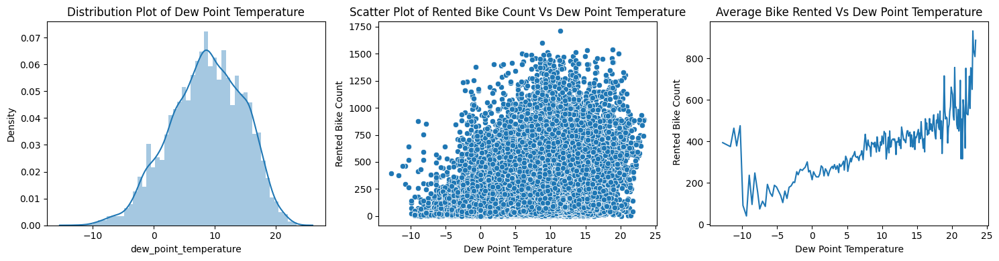

In [116]:
fig,ax = plt.subplots(1,3, figsize=(15,4))

# Univariate analysis
dist = sns.distplot(bike_df.dew_point_temperature, ax = ax[0])
dist.set_title('Distribution Plot of Dew Point Temperature')

# Bi-variate analysis 
# Rented Bike Count Vs Dew Point Temperature
scatter = sns.scatterplot(data=bike_df, x='dew_point_temperature', y='rented_bike_count', ax = ax[1])
scatter.set(xlabel='Dew Point Temperature', ylabel='Rented Bike Count', title='Scatter Plot of Rented Bike Count Vs Dew Point Temperature')

# Line Plot
group_dew_point_temperature = bike_df.groupby(['dew_point_temperature'])['rented_bike_count'].mean().reset_index()
line = sns.lineplot(data = group_dew_point_temperature, x ='dew_point_temperature', y = 'rented_bike_count', ax= ax[2])
line.set(xlabel='Dew Point Temperature', ylabel = ' Rented Bike Count', title='Average Bike Rented Vs Dew Point Temperature')

plt.tight_layout()
plt.show()

**Observation:**

    first graph
* The dew point temperature distribution follows a bell shape, indicating a relatively normal distribution

        Second graph
* The points are scattered across the dew point temperature range, with a higher concentration of locations for temperatures between 0 and 15 degrees Celsius.
* There seems to be a general trend that the higher the dew point temperature, the more bikes are rented.

                    Third graph
* The line shows an ascending trend indicating that the average number of bikes rented increases with dew point temperature.
* At very low temperatures (below 0 degrees Celsius), the average number of bikes rented is more variable and generally lower.
* For positive dew point temperatures (above 0 degrees Celsius), there is a more stable increase in the average number of bikes rented, with a marked increase above 15 degrees Celsius.

### **4.5 Column steam_pressure**

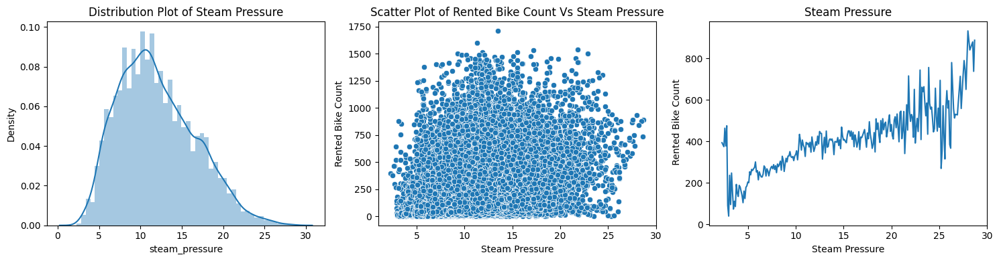

In [117]:
fig,ax = plt.subplots(1,3, figsize=(15,4))

# Univariate analysis
dist = sns.distplot(bike_df.steam_pressure, ax = ax[0])
dist.set_title('Distribution Plot of Steam Pressure')

# Bi-variate analysis 
# Rented Bike Count Vs Steam pressure
scatter = sns.scatterplot(data=bike_df, x='steam_pressure', y='rented_bike_count', ax = ax[1])
scatter.set(xlabel='Steam Pressure', ylabel='Rented Bike Count', title='Scatter Plot of Rented Bike Count Vs Steam Pressure')

# Line Plot
group_steam_pressure = bike_df.groupby(['steam_pressure'])['rented_bike_count'].mean().reset_index()
line = sns.lineplot(data = group_steam_pressure, x ='steam_pressure', y = 'rented_bike_count', ax= ax[2])
line.set(xlabel='Steam Pressure', ylabel = ' Rented Bike Count', title='Steam Pressure')

plt.tight_layout()
plt.show()

**observation:**

* The steam pressure distribution (steam_pressure) shows a slightly asymmetrical curve with a peak around 12 units.
* Line plot of steam pressure is very similar to dew_point_temperature pattern

### **4.6 Column: 'humidity'**

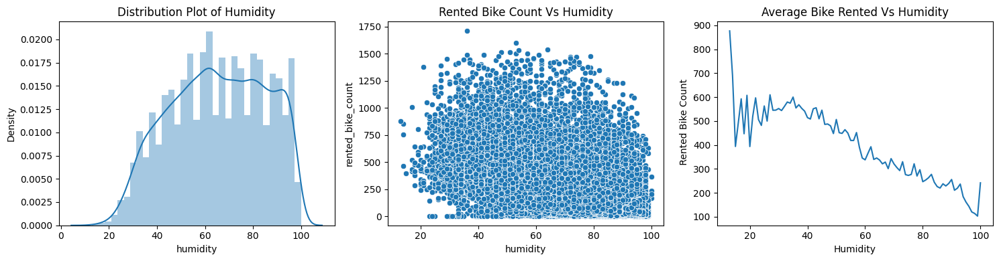

In [118]:
fig,ax = plt.subplots(1,3, figsize=(15,4))

# Univariate analysis
dist = sns.distplot(bike_df.humidity, ax = ax[0])
dist.set_title('Distribution Plot of Humidity')

# Bi-variate analysis 
# Rented Bike Count Vs Humidity
scatter = sns.scatterplot(data=bike_df, x='humidity', y='rented_bike_count', ax = ax[1])
scatter.set(xlabel='humidity', ylabel='rented_bike_count', title='Rented Bike Count Vs Humidity')

# Line Plot
group_wind_speed = bike_df.groupby(['humidity'])['rented_bike_count'].mean().reset_index()
line = sns.lineplot(data=group_wind_speed, x='humidity', y = 'rented_bike_count', ax= ax[2])
line.set(xlabel='Humidity', ylabel = ' Rented Bike Count', title='Average Bike Rented Vs Humidity')

plt.tight_layout()
plt.show()

**Observation:**

    First graph
* The distribution appears to be slightly skewed to the right (positively skewed), and widespread with humidity values concentrating around 45-97.
* There are fewer days with very low (0-20) or very high (100) humidity levels.

        Second graph
* There appears to be a wide variation in the number of bikes rented across all humidity values.
* However, it is difficult to discern a clear trend from this scatterplot alone. This justifies the creation of the third graph to better understand this relationship.

                Third graph
* There is a general trend of decreasing the average number of bikes rented as humidity increases.
* There is a high spike in rentals at very low humidity (around 0-10), but this could be due to a low number of data points in this range.
* Between 20 and 80 humidity, the average number of bikes rented remains relatively high and then begins to gradually decrease.
* Beyond 80, the average number of bicycles rented decreases more markedly.

### **4.7 Column humidity_duration**

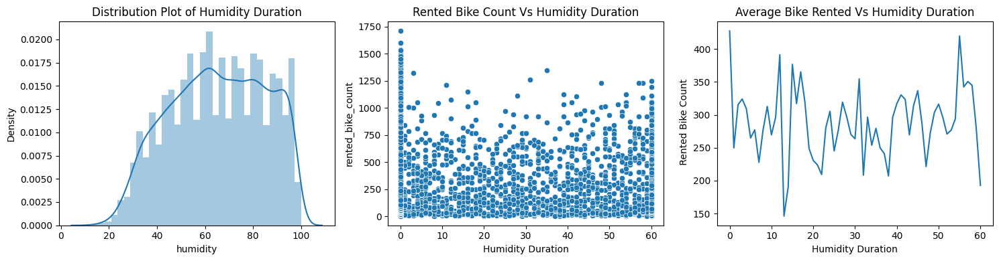

In [119]:
fig,ax = plt.subplots(1,3, figsize=(15,4))

# Univariate analysis
dist = sns.distplot(bike_df.humidity, ax = ax[0])
dist.set_title('Distribution Plot of Humidity Duration')

# Bi-variate analysis 
# Rented Bike Count Vs Humidity Duration
scatter = sns.scatterplot(data=bike_df, x='humidity_duration', y='rented_bike_count', ax = ax[1])
scatter.set(xlabel='Humidity Duration', ylabel='rented_bike_count', title='Rented Bike Count Vs Humidity Duration')

# Line Plot
group_wind_speed = bike_df.groupby(['humidity_duration'])['rented_bike_count'].mean().reset_index()
line = sns.lineplot(data=group_wind_speed, x='humidity_duration', y = 'rented_bike_count', ax= ax[2])
line.set(xlabel='Humidity Duration', ylabel = ' Rented Bike Count', title='Average Bike Rented Vs Humidity Duration')

plt.tight_layout()
plt.show()

**Obsrevattions:**

* The number of rented bikes seems to be more dispersed and less influenced by humidity duration values.
* The line graph shows that the average number of bikes rented varies significantly with the duration of humidity
* There is no clear trend observable, indicating that the duration of humidity may not have a direct and linear influence on the number of bikes rented.

### **4.8 Column wind_speed**

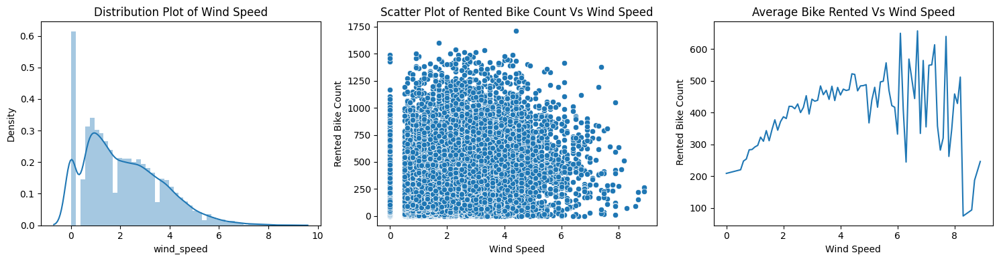

In [120]:
fig,ax = plt.subplots(1,3, figsize=(15,4))

# Univariate analysis
dist = sns.distplot(bike_df.wind_speed, ax = ax[0])
dist.set_title('Distribution Plot of Wind Speed')

# Bi-variate analysis 
# Rented Bike Count Vs Wind Speed
scatter = sns.scatterplot(data=bike_df, x='wind_speed', y='rented_bike_count', ax = ax[1])
scatter.set(xlabel='Wind Speed', ylabel='Rented Bike Count', title='Scatter Plot of Rented Bike Count Vs Wind Speed')

# Line Plot
group_wind_speed = bike_df.groupby(['wind_speed'])['rented_bike_count'].mean().reset_index()
line = sns.lineplot(data=group_wind_speed, x='wind_speed', y = 'rented_bike_count', ax= ax[2])
line.set(xlabel='Wind Speed', ylabel = ' Rented Bike Count', title='Average Bike Rented Vs Wind Speed')

plt.tight_layout()
plt.show()

**Observation:**
* We can see from the distribution plot that wind speed is slightly positively skewed.
* Scatter Plot tells us about the distribution of the wind speed and rented bike count, and how the values of the two variables are related to each other.
* Line plot tells us that people prefer moderate wind but there is a spike at wind speed 7.

### **4.9 Column: 'inst_wind_speed_min'**

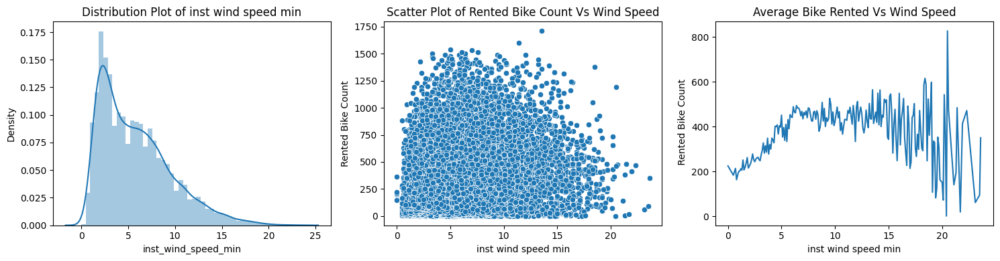

In [121]:
fig,ax = plt.subplots(1,3, figsize=(15,4))

# Univariate analysis
dist = sns.distplot(bike_df.inst_wind_speed_min, ax = ax[0])
dist.set_title('Distribution Plot of inst wind speed min')

# Bi-variate analysis 
# Rented Bike Count Vs Wind Speed
scatter = sns.scatterplot(data=bike_df, x='inst_wind_speed_min', y='rented_bike_count', ax = ax[1])
scatter.set(xlabel='inst wind speed min', ylabel='Rented Bike Count', title='Scatter Plot of Rented Bike Count Vs Wind Speed')

# Line Plot
group_wind_speed = bike_df.groupby(['inst_wind_speed_min'])['rented_bike_count'].mean().reset_index()
line = sns.lineplot(data=group_wind_speed, x='inst_wind_speed_min', y = 'rented_bike_count', ax= ax[2])
line.set(xlabel='inst wind speed min', ylabel = ' Rented Bike Count', title='Average Bike Rented Vs Wind Speed')

plt.tight_layout()
plt.show()

**Observation:**
* The distribution of minimum instantaneous wind speed appears to be asymmetrical, with a higher concentration of values between 0 and 10 m/s.
* There seems to be a general trend where a high number of bikes are rented when the minimum instantaneous wind speed is low (between 0 and 10 m/s)
* After 15 m/s, the trend becomes less clear and seems to fluctuate more, which could be due to a decrease in the number of observations at these higher wind speeds.

### **4.10 Column: 'visibility'**

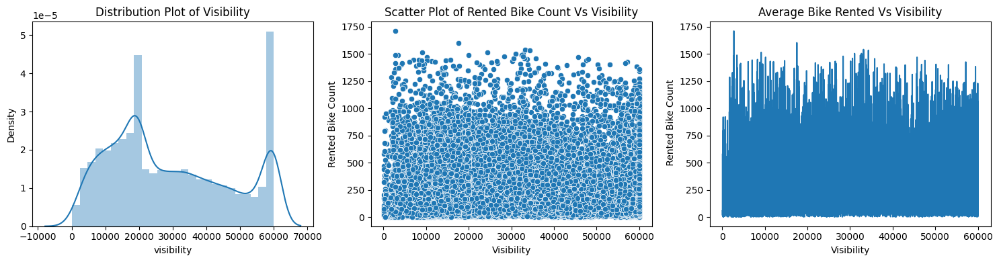

In [122]:
fig,ax = plt.subplots(1,3, figsize=(15,4))

# Univariate analysis
dist = sns.distplot(bike_df.visibility, ax = ax[0])
dist.set_title('Distribution Plot of Visibility')

# Bi-variate analysis 
# Rented Bike Count Vs Visibility
scatter = sns.scatterplot(data=bike_df, x='visibility', y='rented_bike_count', ax = ax[1])
scatter.set(xlabel='Visibility', ylabel='Rented Bike Count', title='Scatter Plot of Rented Bike Count Vs Visibility')

# Line Plot
group_visibility = bike_df.groupby(['visibility'])['rented_bike_count'].mean().reset_index()
line = sns.lineplot(data=group_visibility, x='visibility', y = 'rented_bike_count', ax= ax[2])
line.set(xlabel='Visibility', ylabel = ' Rented Bike Count', title='Average Bike Rented Vs Visibility')

plt.tight_layout()
plt.show()

**Observation:**
* Visibility can be seen to show two distinct peaks around 15,000 and 60,000 millimetres. This distribution suggests that days of low and high visibility are relatively frequent, while days of intermediate visibility are less common in Marseille.
* The scatter plot shows us that bike rentals are relatively evenly distributed across all visibility ranges. This is confirmed by the 3rd graph, which also implies that the average number of bikes rented remains relatively constant, irrespective of this variable. 
* This indicates that visibility, as an isolated variable, does not have a strong effect on the number of bikes rented. There is no clear trend indicating a significant increase or decrease in bike rentals as a function of visibility. The observable variability in the data may be due to other factors not captured by the measurement of this variable alone.

### **4.11 Column: 'solar_radiation'**

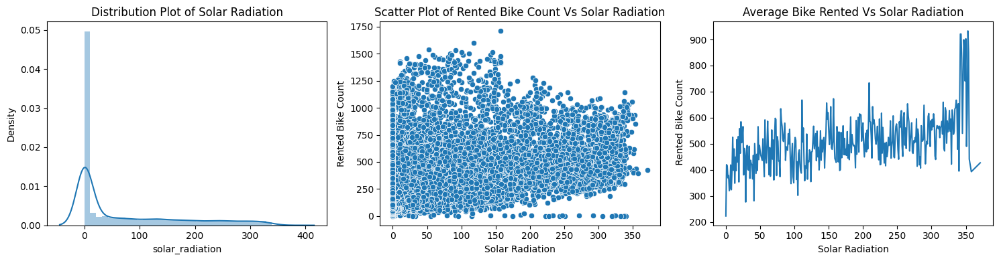

In [123]:
fig,ax = plt.subplots(1,3, figsize=(15,4))

# Univariate analysis
dist = sns.distplot(bike_df.solar_radiation, ax = ax[0])
dist.set_title('Distribution Plot of Solar Radiation')

# Bi-variate analysis 
# Rented Bike Count Vs Solar Radiation
scatter = sns.scatterplot(data=bike_df, x='solar_radiation', y='rented_bike_count', ax = ax[1])
scatter.set(xlabel='Solar Radiation', ylabel='Rented Bike Count', title='Scatter Plot of Rented Bike Count Vs Solar Radiation')

# Line Plot
group_solar_radiation = bike_df.groupby(['solar_radiation'])['rented_bike_count'].mean().reset_index()
line = sns.lineplot(data = group_solar_radiation, x ='solar_radiation', y = 'rented_bike_count', ax= ax[2])
line.set(xlabel='Solar Radiation', ylabel = ' Rented Bike Count', title='Average Bike Rented Vs Solar Radiation')

plt.tight_layout()
plt.show()

**Observation:**
* The 1st plot shows that most days in the city of Marseille have low solar radiation through this highly skewed distribution to the right, with a high probability density for low values.
* The scatter plot highlights a demand for bicycle rentals that is fairly dispersed over the whole range of solar radiation values. Similar to the visibility variable, the average number of bikes rented remains relatively stable over most solar radiation ranges, with fairly random fluctuations. 
* There is, however, a notable spike at a very high value, but this could be due to a low number of data points at this end of the scale. We can therefore also conclude that the observable variability in demand may be due to other factors not captured by the measurement of this variable alone, even though there is a significant concentration of points around the lower radiation values.

### **4.12 Column: 'rainfall'**

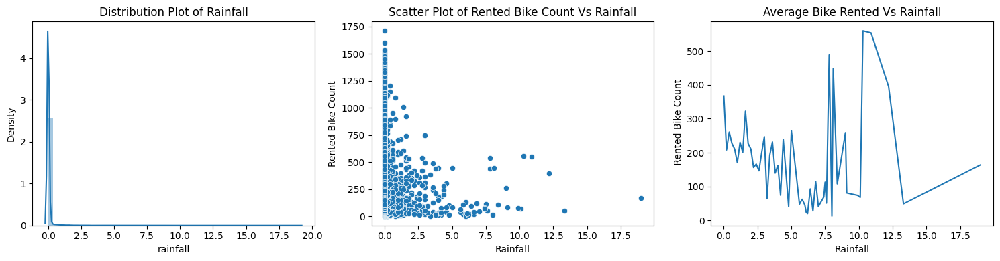

In [124]:
fig,ax = plt.subplots(1,3, figsize=(15,4))

# Univariate analysis
dist = sns.distplot(bike_df.rainfall, ax = ax[0])
dist.set_title('Distribution Plot of Rainfall')

# Bi-variate analysis 
# Rented Bike Count Vs Rainfall
scatter = sns.scatterplot(data=bike_df, x='rainfall', y='rented_bike_count', ax = ax[1])
scatter.set(xlabel='Rainfall', ylabel='Rented Bike Count', title='Scatter Plot of Rented Bike Count Vs Rainfall')

# Line Plot
group_rainfall = bike_df.groupby(['rainfall'])['rented_bike_count'].mean().reset_index()
line = sns.lineplot(data = group_rainfall, x ='rainfall', y = 'rented_bike_count', ax= ax[2])
line.set(xlabel='Rainfall', ylabel = ' Rented Bike Count', title='Average Bike Rented Vs Rainfall')

plt.tight_layout()
plt.show()

**Observation:**
* Distribution of rainfall is highly skewed to the positive side with a large majority of values close to zero.
* There are very few days with high precipitation values, indicating that days with no rain or very little rain are much more common
* There is a general trend indicating that when precipitation increases, the number of rental bikes tends to decrease. However, there are some exceptions where rentals have been made even with moderate precipitation. These are users who rent bikes to move more quickly in the event of the start of rain, to avoid being still uncovered in the event of heavy rain.

### **4.13 Column: 'seasons'**

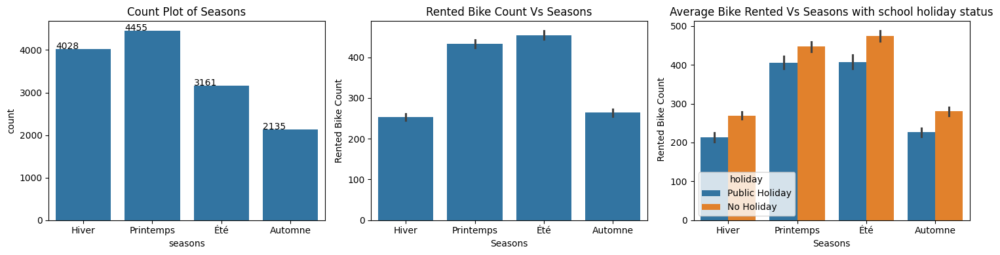

In [125]:
fig,ax = plt.subplots(1,3, figsize=(15,4))

# Univariate analysis
count = sns.countplot(data=bike_df, x='seasons', ax=ax[0])
count.set_title('Count Plot of Seasons')

# adding value count on the top of bar
for p in count.patches:
    count.annotate(format(p.get_height(), '.0f'), (p.get_x(), p.get_height()))

# Bi-variate analysis 
# Rented Bike Count Vs Seasons
bar = sns.barplot(data=bike_df, x='seasons', y='rented_bike_count', ax = ax[1])
bar.set(xlabel='Seasons', ylabel='Rented Bike Count', title='Rented Bike Count Vs Seasons')

# Multi-variate analysis
cat = sns.barplot(data=bike_df, x='seasons', y='rented_bike_count', hue='holiday', ax= ax[2])
cat.set(xlabel='Seasons', ylabel = ' Rented Bike Count', title='Average Bike Rented Vs Seasons with school holiday status')

plt.tight_layout()
plt.show()

**observations:**
* Analysis of the data shows a disparity in the number of observations between seasons, with winter and spring having a higher number of observations than summer and autumn. This difference is attributable to the fact that the data collection period covers two full seasons for winter and spring, whereas it covers only one season for summer and autumn.
* Spring has the highest average number of bikes rented, with an average of 400 bikes per day. This is followed by summer, autumn and finally winter, when the average number of bike rentals is lowest. 
* This trend can be explained by the milder weather conditions in spring and summer, which are conducive to cycling, in contrast to the harsher conditions in winter.

### **4.14 Column: 'holiday'**

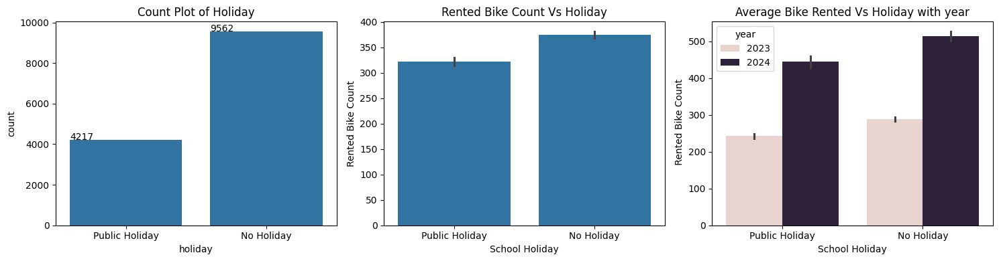

In [126]:
fig,ax = plt.subplots(1,3, figsize=(15,4))

# Univariate analysis
count = sns.countplot(data=bike_df, x='holiday', ax=ax[0])
count.set_title('Count Plot of Holiday')

# adding value count on the top of bar
for p in count.patches:
    count.annotate(format(p.get_height(), '.0f'), (p.get_x(), p.get_height()))

# Bi-variate analysis 
# Rented Bike Count Vs Holiday
bar = sns.barplot(data=bike_df, x='holiday', y='rented_bike_count', ax = ax[1])
bar.set(xlabel='School Holiday', ylabel='Rented Bike Count', title='Rented Bike Count Vs Holiday')

# Multi-variate analysis
cat = sns.barplot(data=bike_df, x='holiday', y='rented_bike_count', hue='year', ax= ax[2])
cat.set(xlabel='School Holiday', ylabel = ' Rented Bike Count', title='Average Bike Rented Vs Holiday with year')

plt.tight_layout()
plt.show()

**observations:**
* There are therefore 8146 working days in the dataset, double the number of vacation days. On average, we observe that working days record a higher demand for bicycles in the metropolis (around 325), than vacation days (275). 
* This reinforces the idea that bicycles are mainly used for daily commuting rather than for leisure on vacation days.
* The 3rd graph shows that the average number of self-service bike rentals in the metropolis in 2024 will be significantly higher than in the previous year. This could reflect a general upward trend in the popularity of bikes in the metropolis, or an improvement in the favorable conditions for bike rental in 2024.

## **5. Data Cleaning**

#### **What is data cleaning?**
* Data cleaning is the process of identifying and correcting or removing inaccuracies, inconsistencies, and missing values in a dataset. It is an important step in the data preparation process that ensures that the data is accurate, complete, and in a format that can be easily analyzed. Data cleaning may include tasks such as removing duplicate records, filling in missing values, correcting errors, and standardizing data formats. The goal of data cleaning is to improve the quality of the data and make it suitable for further analysis and modeling.

### **5.1 Duplicate Values**

In [127]:
bike_df = bike_df.drop(columns=['dates'])
# counting duplicate values
bike_df.duplicated().sum()

0

There is no duplicate record in the dataset

### **5.2 Missing Values**

In [128]:
# Missing Values/Null Values Count
print(bike_df.isnull().sum())

year                     0
month                    0
day                      0
hour                     0
rented_bike_count        0
rainfall                 0
wind_speed               0
wind_direction           0
inst_wind_speed_min      0
temperature              0
dew_point_temperature    0
humidity                 0
humidity_duration        0
steam_pressure           0
visibility               0
solar_radiation          0
weekday                  0
seasons                  0
holiday                  0
session                  0
dtype: int64


<Axes: >

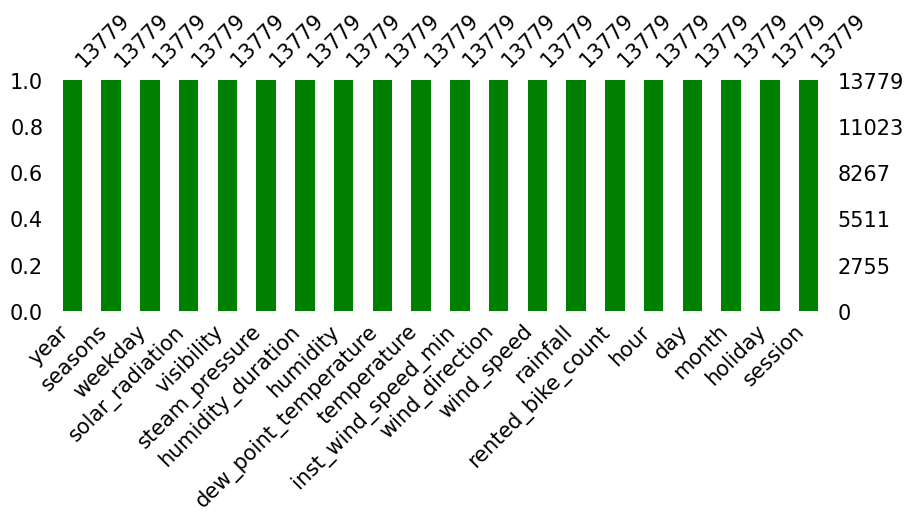

In [129]:
# Visualizing the missing values

msno.bar(bike_df, color='green',sort='ascending', figsize=(10,3), fontsize=15)

Fortunately there is no missing value in the dataset

### **5.3 Skewness**

In [130]:
# statistical summary
bike_df.describe().T

,count,mean,std,min,25%,50%,75%,max
year,13779.0,2023.389506,0.487656,2023.0,2023.00,2023.0,2024.0,2024.0
month,13779.0,5.611946,3.253414,1.0,3.00,5.0,8.0,12.0
day,13779.0,15.696350,8.840490,1.0,8.00,16.0,23.0,31.0
hour,13779.0,11.519849,6.917716,0.0,6.00,12.0,18.0,23.0
rented_bike_count,13779.0,359.239422,299.637227,1.0,97.00,303.0,539.0,1710.0
rainfall,13779.0,0.060897,0.506797,0.0,0.00,0.0,0.0,19.0
wind_speed,13779.0,2.120357,1.557167,0.0,0.90,1.9,3.2,8.9
wind_direction,13779.0,184.219464,106.390959,0.0,90.00,240.0,280.0,360.0
inst_wind_speed_min,13779.0,5.822280,3.781253,0.0,2.70,5.0,8.0,23.6
temperature,13779.0,16.002482,7.699504,-2.6,10.20,15.5,21.4,39.4


As can be seen in the statistical summary for numerical features, there is a significant difference between the 75% percentile and maximum value, indicating that the dataset contains skewness and outliers.

In [131]:
numerical_features = []
categorical_features = []

# splitting features into numeric and categoric.
'''
If feature has more than 35 categories we will consider it
as numerical_features, remaining features will be added to categorical_features.
'''
for col in bike_df.columns:  
  if bike_df[col].nunique() > 35:
    numerical_features.append(col) 
  else:
    categorical_features.append(col) 

print(f'Numerical Features : {numerical_features}')
print(f'Categorical Features : {categorical_features}')

Numerical Features : ['rented_bike_count', 'rainfall', 'wind_speed', 'wind_direction', 'inst_wind_speed_min', 'temperature', 'dew_point_temperature', 'humidity', 'humidity_duration', 'steam_pressure', 'visibility', 'solar_radiation']
Categorical Features : ['year', 'month', 'day', 'hour', 'weekday', 'seasons', 'holiday', 'session']


In [132]:
# we do not want any transformation in our target variable as it is possible to have outlier is Marseille Environment
numerical_features.remove('rented_bike_count')
# removing rainfall and snowfall as it may remove important information as these 2 columns are highly skewed.
numerical_features.remove('rainfall')

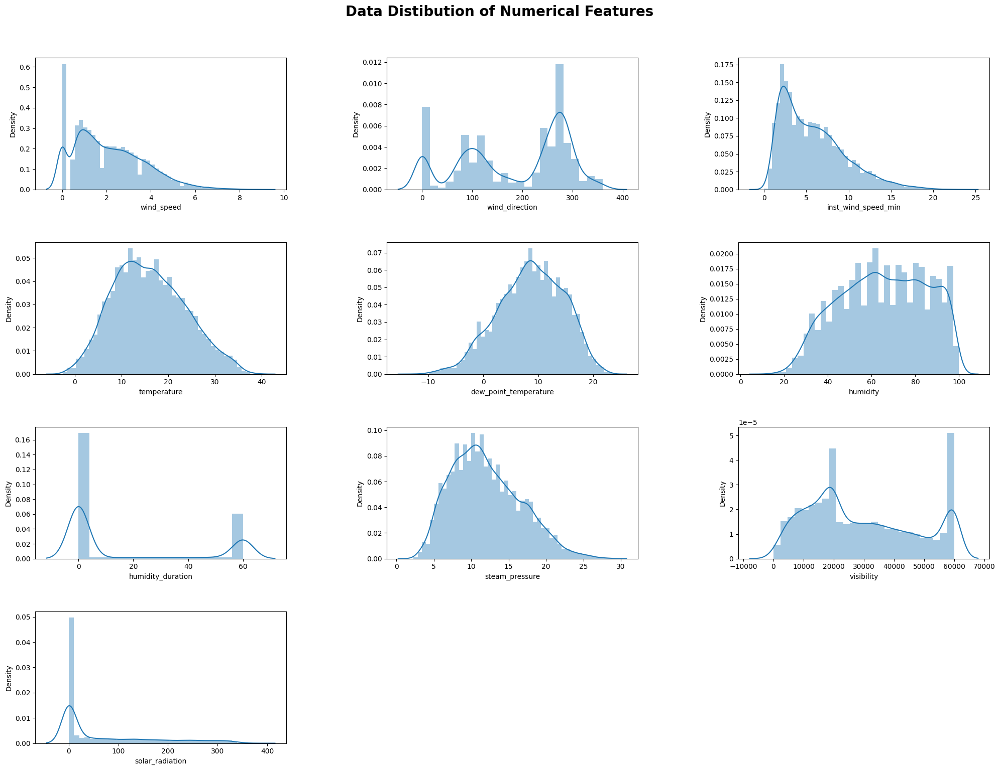

In [133]:
# figsize
plt.figure(figsize=(20,15))
# title
plt.suptitle('Data Distibution of Numerical Features', fontsize=20, fontweight='bold', y=1.02)

for i,col in enumerate(numerical_features):
  plt.subplot(4, 3, i+1)                       # subplots 2 rows, 3 columns

  # dist plots
  sns.distplot(bike_df[col])  
  # x-axis label
  plt.xlabel(col)
  plt.tight_layout()    

# Adjust layout for better spacing
plt.subplots_adjust(top=0.95, hspace=0.4, wspace=0.4)

plt.show()

**Observation:**
* For numerical features, we can see that the majority of distributions are right-skewed. The distribution of rainfall, and solar radiation is highly skewed to the right. It demonstrates that these columns have many outliers. Some columns are negatively skewed.
* Some of the variables can get a normal distribution when outliers are removed. As a result, it appears that outliers should be removed before the transformation. First, we will get rid of outliers, and then we check to see if we need to use the transformation technique again.

### **5.4 Treating Outliers**

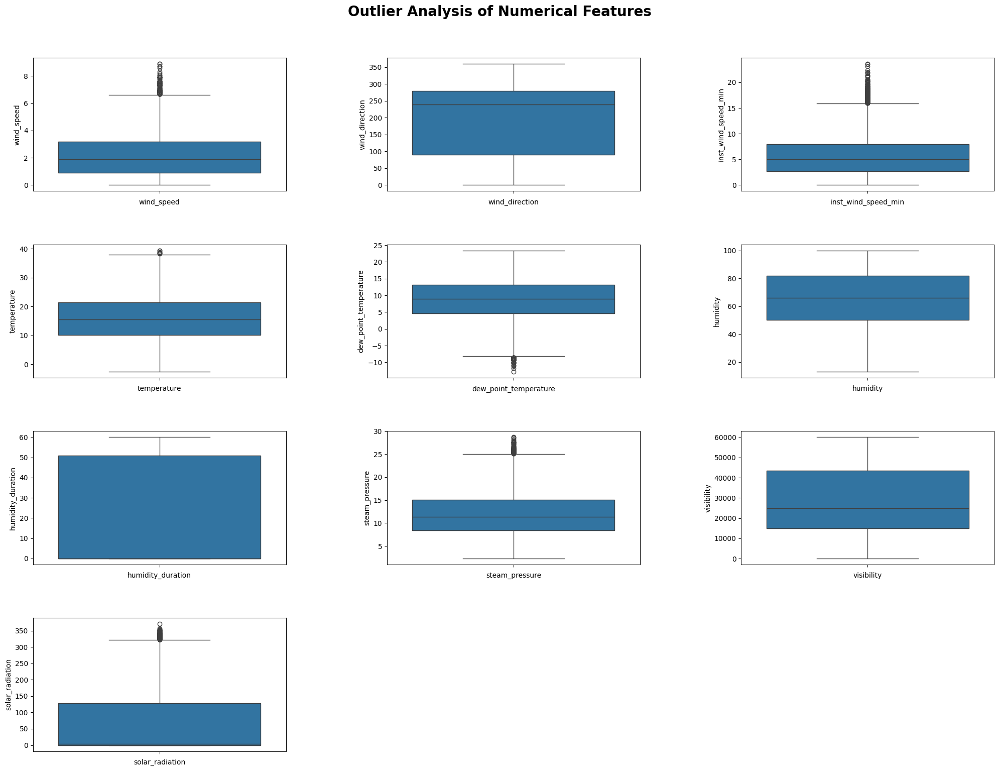

In [134]:
# figsize
plt.figure(figsize=(20,15))
# title
plt.suptitle('Outlier Analysis of Numerical Features', fontsize=20, fontweight='bold', y=1.02)

for i,col in enumerate(numerical_features):
  plt.subplot(4, 3, i+1)            # subplot of 2 rows and 3 columns

  # countplot
  sns.boxplot(bike_df[col])
  # x-axis label
  plt.xlabel(col)
  plt.tight_layout()
    
# Adjust layout for better spacing
plt.subplots_adjust(top=0.95, hspace=0.4, wspace=0.4)

plt.show()

**Observation:** 
* Outliers are visible in the 'wind_speed', 'inst_wind_speed_min', 'temperature', 'dew_point_temperature', 'steam_pressure' and 'solar_radiation' columns.

* Since we have limited datapoint hence we are not simply removing the outlier instead of that we are using the clipping method.

**Clipping Method:** In this method, we set a cap on our outliers data, which means that if a value is higher than or lower than a certain threshold, all values will be considered outliers. This method replaces values that fall outside of a specified range with either the minimum or maximum value within that range.

In [135]:
# we are going to replace the datapoints with upper and lower bound of all the outliers

def clip_outliers(bike_df):
    for col in bike_df[numerical_features]:
        # using IQR method to define range of upper and lower limit.
        q1 = bike_df[col].quantile(0.25)
        q3 = bike_df[col].quantile(0.75)
        iqr = q3 - q1
        lower_bound = q1 - 1.5 * iqr
        upper_bound = q3 + 1.5 * iqr
        
        # replacing the outliers with upper and lower bound
        bike_df[col] = bike_df[col].clip(lower_bound, upper_bound)
    return bike_df

In [136]:
# using the function to treat outliers
bike_df = clip_outliers(bike_df)

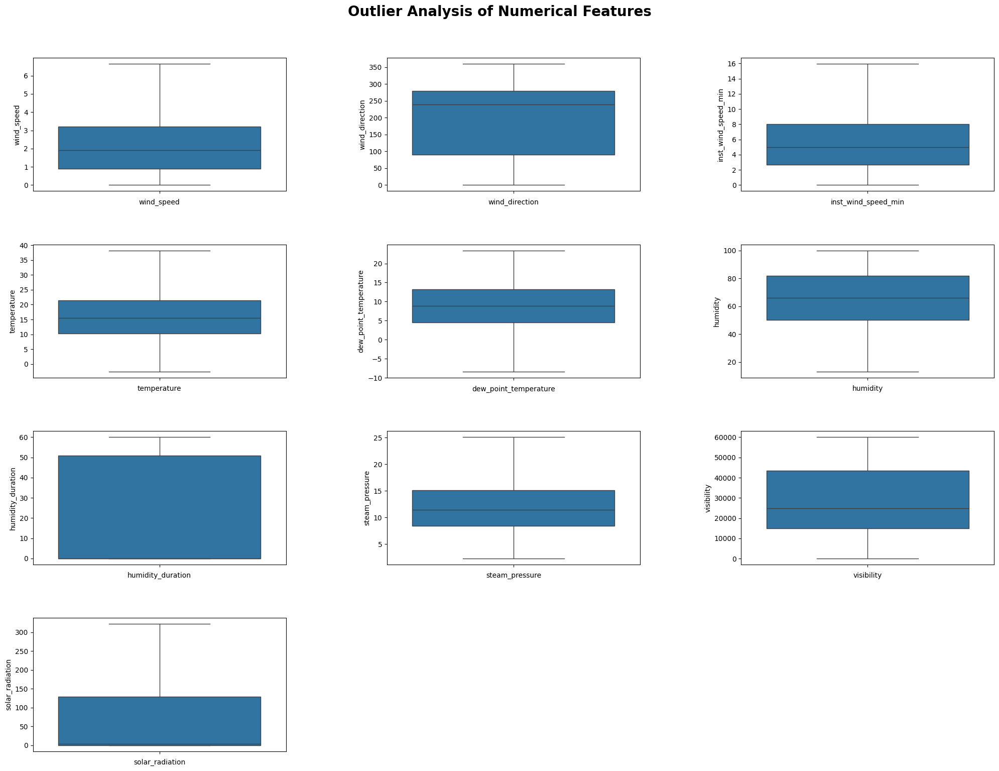

In [137]:
# figsize
plt.figure(figsize=(20,15))
# title
plt.suptitle('Outlier Analysis of Numerical Features', fontsize=20, fontweight='bold', y=1.02)

for i,col in enumerate(numerical_features):
  plt.subplot(4, 3, i+1)            # subplot of 2 rows and 3 columns

  # countplot
  sns.boxplot(bike_df[col])
  # x-axis label
  plt.xlabel(col)
  plt.tight_layout()
    
# Adjust layout for better spacing
plt.subplots_adjust(top=0.95, hspace=0.4, wspace=0.4)

plt.show()

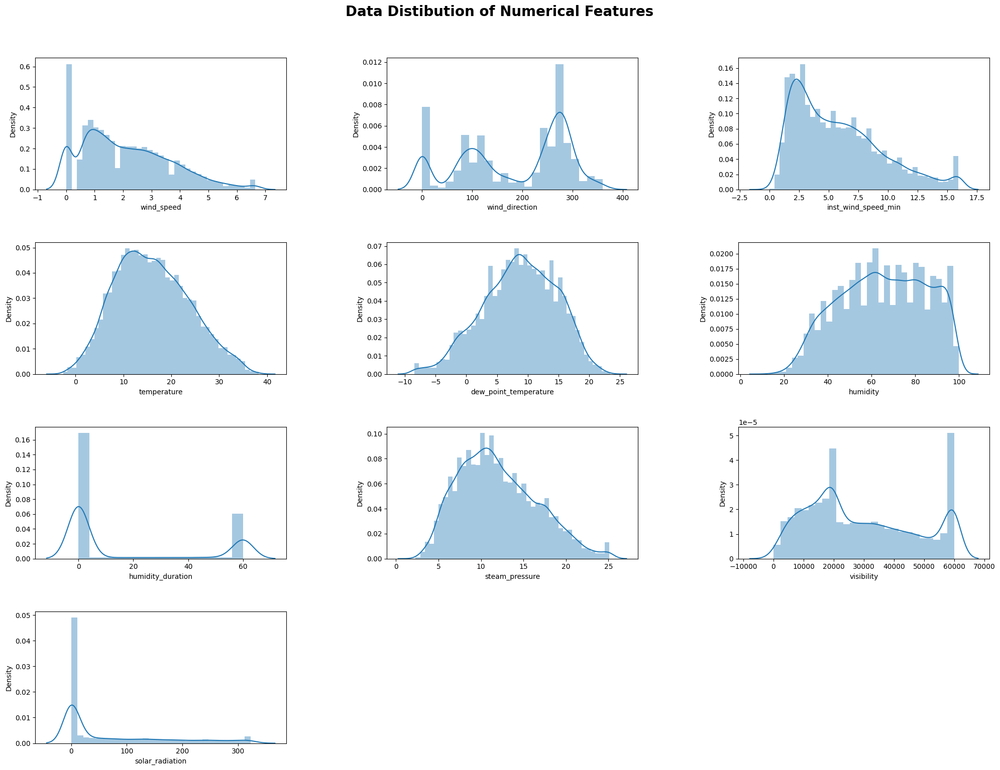

In [138]:
# figsize
plt.figure(figsize=(20,15))
# title
plt.suptitle('Data Distibution of Numerical Features', fontsize=20, fontweight='bold', y=1.02)

for i,col in enumerate(numerical_features):
  plt.subplot(4, 3, i+1)                       # subplots 2 rows, 3 columns

  # dist plots
  sns.distplot(bike_df[col])  
  # x-axis label
  plt.xlabel(col)
  plt.tight_layout()    

# Adjust layout for better spacing
plt.subplots_adjust(top=0.95, hspace=0.4, wspace=0.4)

plt.show()

## **6. Feature Engineering**

* Feature engineering is the process of creating new features from existing ones to improve the performance of a machine-learning model. This involves transforming raw data into a more useful and informative form, by either creating new features from the existing data or selecting only the most relevant features from the raw data. 
* The goal of feature engineering is to extract relevant information from the raw data and represent it in a way that can be easily understood by the machine learning model. The success of a machine learning model depends heavily on the quality of the features used as inputs, so feature engineering plays an important role in model performance.

### **6.1 Correlation Coefficient and Heatmap**

* The correlation coefficient is a numerical measure of the strength and direction of a linear relationship between two variables. In other words, it measures the extent to which changes in one variable are associated with changes in the other variable. The correlation coefficient ranges from -1 to 1, with -1 indicating a perfect negative correlation, 1 indicating a perfect positive correlation, and 0 indicating no correlation.

* The correlation coefficient is an important tool in data analysis and machine learning, as it can help to identify relationships between variables and can be used in feature selection techniques to remove highly correlated features, which can reduce overfitting and improve the performance of the model.

<Axes: >

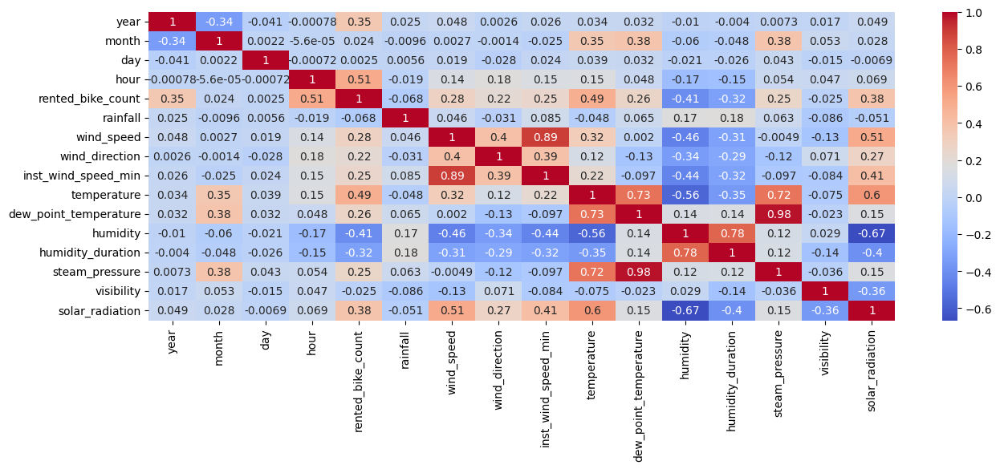

In [139]:
# Plotting correlation heatmap
plt.figure(figsize=(15,5))
# Filtrer uniquement les colonnes numériques
numerical_features2 = bike_df.select_dtypes(include=[np.number])
sns.heatmap(numerical_features2.corr(), annot=True, cmap='coolwarm')   

In [140]:
# find and remove correlated features

def correlation(dataset, threshold):
    col_corr = set()                                           # Set of all the names of correlated features
    corr_matrix = dataset.corr()
    for i in range(len(corr_matrix.columns)):
        for j in range(i):
            if abs(corr_matrix.iloc[i, j]) > threshold:        # we are interested in absolute coeff value
                colname = corr_matrix.columns[i]               # getting the name of column
                col_corr.add(colname)
    return col_corr

In [141]:
# checking the highly correlated features
correlation(numerical_features2, 0.7)          # setting threshold of 0.7

{'dew_point_temperature',
 'humidity_duration',
 'inst_wind_speed_min',
 'steam_pressure'}

In [142]:
# droping dew_point_temperature column due to multi-collinearity
numerical_features2 = numerical_features2.drop(columns=['dew_point_temperature', 'humidity_duration', 'inst_wind_speed_min', 'steam_pressure'])
numerical_features2.head()

,year,month,day,hour,rented_bike_count,rainfall,wind_speed,wind_direction,temperature,humidity,visibility,solar_radiation
0,2023,1,1,0,52,0.0,3.8,100.0,13.4,84.0,34060.0,0.0
1,2023,1,1,1,55,0.0,3.8,80.0,13.6,83.0,39322.0,0.0
2,2023,1,1,2,58,0.0,3.8,100.0,13.9,81.0,39468.0,0.0
3,2023,1,1,3,77,0.0,5.0,90.0,14.0,81.0,38313.0,0.0
4,2023,1,1,4,43,0.0,5.3,100.0,14.4,81.0,41397.0,0.0


In [143]:
numerical_features

['wind_speed',
 'wind_direction',
 'inst_wind_speed_min',
 'temperature',
 'dew_point_temperature',
 'humidity',
 'humidity_duration',
 'steam_pressure',
 'visibility',
 'solar_radiation']

### **6.2 Regression plot**

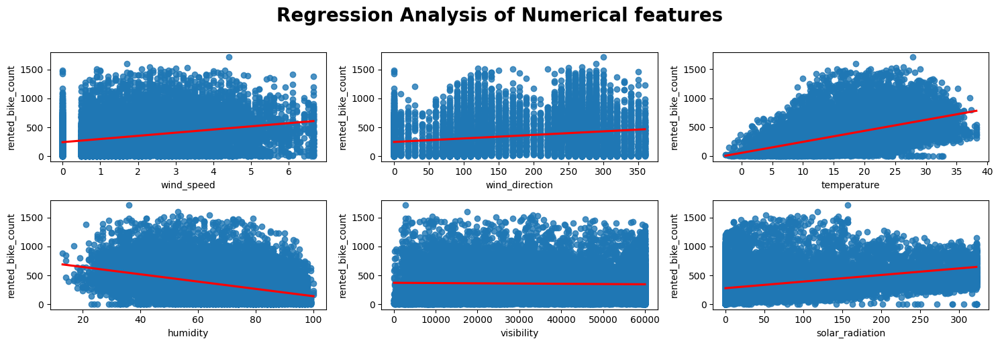

In [144]:
# Checking Linearity of all numerical features with our target variable
# drop highly correlated features
elements_to_remove = ['dew_point_temperature', 'humidity_duration', 'inst_wind_speed_min', 'steam_pressure']

# Supprimer chaque élément de la liste
for element in elements_to_remove:
    numerical_features.remove(element)

# figsize
plt.figure(figsize=(15,5))
# title
plt.suptitle('Regression Analysis of Numerical features', fontsize=20, fontweight='bold', y=1.02)

for i,col in enumerate(numerical_features):
  plt.subplot(2, 3, i+1)                     # subplots of 2 rows and 3 columns

  # regression plots
  sns.regplot(x=bike_df[col], y='rented_bike_count', data=bike_df, line_kws={"color":"r"})
  # x-axis lable
  plt.xlabel(col)
  plt.tight_layout()

* Most of the numerical features are positively correlated to our target variable.

### **6.3 VIF**

VIF (Variance Inflation Factor) analysis is a statistical method used to identify multicollinearity in a set of predictor variables. Multicollinearity is a situation where two or more predictor variables in a regression model are highly correlated with each other, meaning that they provide redundant information about the response variable.

VIF analysis is an important step in the development of a regression model, as it helps to ensure that the results are reliable and interpretable and that the predictor variables are not providing redundant information.

In [145]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

def calc_vif(X):

  # For each X, calculate VIF and save in dataframe
  vif = pd.DataFrame()
  vif["VIF Factor"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
  vif["features"] = X.columns
  
  return vif

In [146]:
calc_vif(numerical_features2[[i for i in numerical_features2.describe().columns]])

,VIF Factor,features
0,69.916319,year
1,4.985558,month
2,4.182253,day
3,5.308012,hour
4,4.555143,rented_bike_count
5,1.078245,rainfall
6,4.472809,wind_speed
7,5.243427,wind_direction
8,13.041167,temperature
9,28.317043,humidity


Since the VIF factor of 'year' is too large hence we will remove the year from our data to build our model.

In [147]:
# droping year column due to multi-collinearity
numerical_features2.drop('year', axis=1, inplace=True)

In [148]:
# Calculating the VIF again
calc_vif(numerical_features2[[i for i in numerical_features2.describe().columns]])

,VIF Factor,features
0,4.962729,month
1,3.949330,day
2,5.130289,hour
3,4.554754,rented_bike_count
4,1.061823,rainfall
5,4.334060,wind_speed
6,4.908140,wind_direction
7,11.797065,temperature
8,6.622203,humidity
9,4.223574,visibility


These are our final numerical variables to be considered for model building.

### **6.4 Encoding**

Encoding is a technique in feature engineering that is used to convert categorical variables into numerical values that can be used by machine learning algorithms.

There are several encoding techniques, including:

* One-hot encoding: creates a binary column for each unique category, with a value of 1 indicating the presence of the category and 0 indicating the absence.
* Label encoding: assigns a unique integer value to each category.
* Ordinal encoding: assigns an ordered integer value to each category based on the natural ordering of the categories.
* Count encoding: replaces a categorical value with the number of times it appears in the dataset.

In [149]:
# dropping year and columns those were created for EDA purpose only and do not account for any information addition
categorical_features.remove('year')
categorical_features.remove('weekday')
categorical_features.remove('session')

These are finals catagericals variables to be considered for the model building

This is the final dataset for the model building

In [150]:
# names of numerical_features2 columns
numerical_columns = numerical_features2.columns.tolist()

# combination
columns_to_keep = list(set(categorical_features + numerical_columns))

# Filter final columns to keep
bike_df = bike_df[columns_to_keep]
bike_df.head()

,wind_speed,wind_direction,holiday,month,hour,temperature,humidity,seasons,rented_bike_count,solar_radiation,visibility,rainfall,day
0,3.8,100.0,Public Holiday,1,0,13.4,84.0,Hiver,52,0.0,34060.0,0.0,1
1,3.8,80.0,Public Holiday,1,1,13.6,83.0,Hiver,55,0.0,39322.0,0.0,1
2,3.8,100.0,Public Holiday,1,2,13.9,81.0,Hiver,58,0.0,39468.0,0.0,1
3,5.0,90.0,Public Holiday,1,3,14.0,81.0,Hiver,77,0.0,38313.0,0.0,1
4,5.3,100.0,Public Holiday,1,4,14.4,81.0,Hiver,43,0.0,41397.0,0.0,1


In [151]:
# Check Unique Values for each categorical variable.
for i in categorical_features:
  print("No. of unique values in",i,"is",bike_df[i].nunique())

No. of unique values in month is 12
No. of unique values in day is 31
No. of unique values in hour is 24
No. of unique values in seasons is 4
No. of unique values in holiday is 2


We will use one hot encoding for 'seasons' and  Numeric encoding for 'school_holiday'. Other columns are already encoded. 

In [152]:
# One Hot Encoding

# One-hot encode the 'seasons' feature
seasons_onehot = pd.get_dummies(bike_df['seasons'], prefix='seasons')

# drop the original features
bike_df.drop('seasons', axis=1, inplace=True)

# concatenate the one-hot encoded season feature with the rest of the data
bike_df = pd.concat([bike_df, seasons_onehot], axis=1)

In [153]:
# Numerical Encoding for holiday 
bike_df['holiday'] = bike_df['holiday'].map({'Public Holiday': 1, 'No Holiday': 0})

In [154]:
#Rangement colonne Dates
cols = list(bike_df.columns)
cols.insert(0, cols.pop(cols.index('month')))
cols.insert(1, cols.pop(cols.index('rainfall')))
cols.insert(2, cols.pop(cols.index('wind_speed')))
cols.insert(3, cols.pop(cols.index('humidity')))
cols.insert(4, cols.pop(cols.index('holiday')))
cols.insert(5, cols.pop(cols.index('visibility')))
cols.insert(6, cols.pop(cols.index('day')))
cols.insert(7, cols.pop(cols.index('wind_direction')))
cols.insert(8, cols.pop(cols.index('solar_radiation')))
cols.insert(9, cols.pop(cols.index('hour')))
cols.insert(10, cols.pop(cols.index('temperature')))
cols.insert(11, cols.pop(cols.index('seasons_Automne')))
cols.insert(12, cols.pop(cols.index('seasons_Hiver')))
cols.insert(13, cols.pop(cols.index('seasons_Printemps')))
cols.insert(14, cols.pop(cols.index('seasons_Été')))
cols.insert(14, cols.pop(cols.index('rented_bike_count')))
bike_df = bike_df[cols]
bike_df.head()

,month,rainfall,wind_speed,humidity,holiday,visibility,day,wind_direction,solar_radiation,hour,temperature,seasons_Automne,seasons_Hiver,seasons_Printemps,rented_bike_count,seasons_Été
0,1,0.0,3.8,84.0,1,34060.0,1,100.0,0.0,0,13.4,False,True,False,52,False
1,1,0.0,3.8,83.0,1,39322.0,1,80.0,0.0,1,13.6,False,True,False,55,False
2,1,0.0,3.8,81.0,1,39468.0,1,100.0,0.0,2,13.9,False,True,False,58,False
3,1,0.0,5.0,81.0,1,38313.0,1,90.0,0.0,3,14.0,False,True,False,77,False
4,1,0.0,5.3,81.0,1,41397.0,1,100.0,0.0,4,14.4,False,True,False,43,False


### **6.5 Normalization of Target Variable**

A fundamental component of data mining is data normalization, also known as data pre-processing. It refers to transforming the data, specifically converting the source data into a different format that makes it possible to effectively process the data. Data normalization's primary goal is to reduce or even eliminate duplicate data.

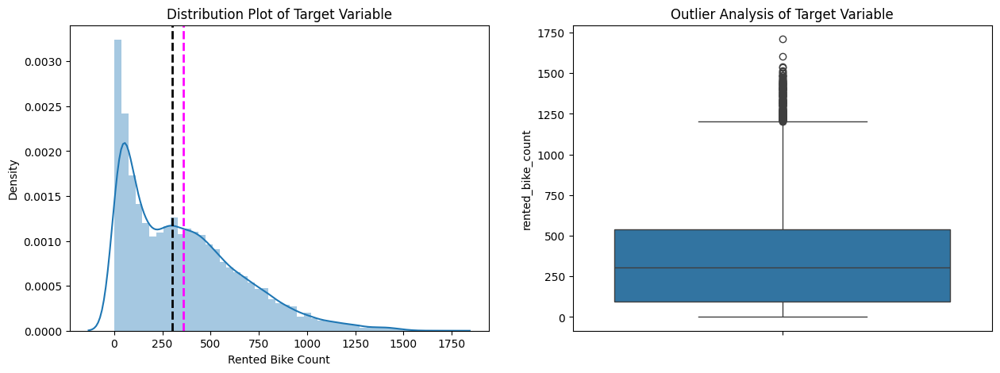

In [155]:
fig, ax = plt.subplots(1,2 , figsize = (15,5))

# Distribution plot of Rented Bike Count
dist =sns.distplot(bike_df['rented_bike_count'],hist=True, ax = ax[0])
dist.set(xlabel = 'Rented Bike Count', ylabel ='Density', title = 'Distribution Plot of Target Variable')

# mean line
dist.axvline(bike_df['rented_bike_count'].mean(), color='magenta', linestyle='dashed', linewidth=2)
# median line
dist.axvline(bike_df['rented_bike_count'].median(), color='black', linestyle='dashed', linewidth=2)

# Boxplot
box = sns.boxplot(bike_df.rented_bike_count, ax= ax[1])
box.set(title = 'Outlier Analysis of Target Variable')
plt.show()

**Observation**
* The graph above indicates that the Rented Bike Count has a moderate right skewness. Linear regression assumes that the dependent variable has a normal distribution, therefore, to meet this assumption, we need to take some measures to normalize the distribution.
* The boxplot above indicates that there are outliers in the rented bike count column.

<Axes: xlabel='rented_bike_count', ylabel='Density'>

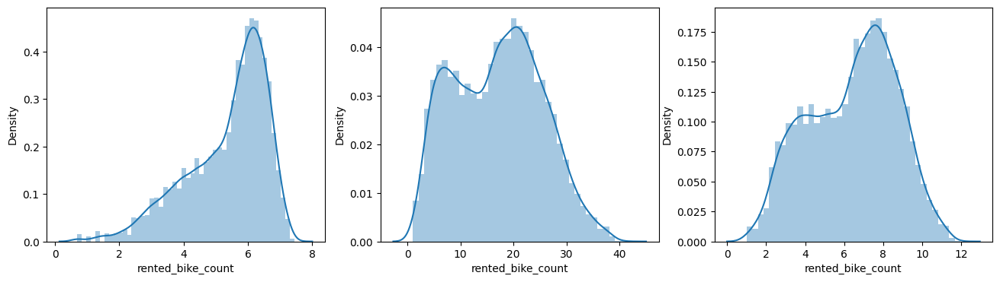

In [156]:
# checking the best transformation for our target variable
fig, axs = plt.subplots(1,3, figsize=(16,4))

sns.distplot(np.log1p(bike_df['rented_bike_count']),kde=True, ax=axs[0])
sns.distplot(np.sqrt(bike_df['rented_bike_count']),kde=True, ax=axs[1])
sns.distplot(np.cbrt(bike_df['rented_bike_count']),kde=True, ax=axs[2])

**Observations**
* Applying a logarithmic transformation to the dependent variable did not help much as it resulted in a negatively skewed distribution. 
* Square root and cube root transformations were attempted, but they did not result in a normally distributed variable. 
* Therefore, we will use a square root transformation for the regression as it transformed the variable into a well-distributed form.

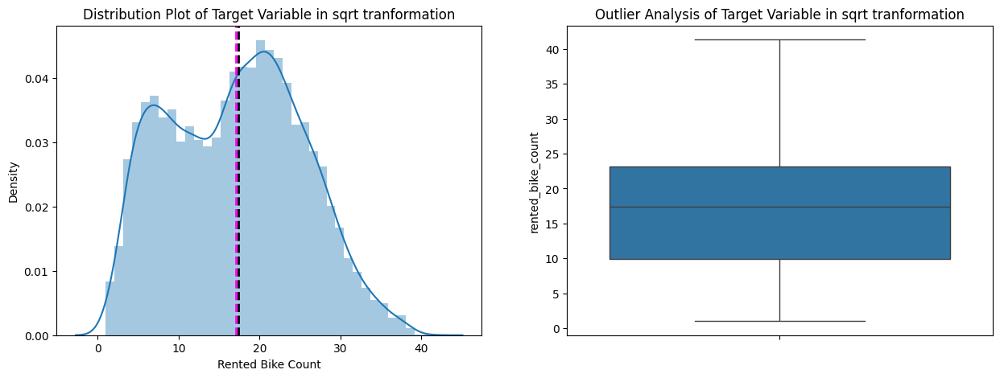

In [157]:
fig, ax = plt.subplots(1,2 , figsize = (15,5))

#  checking square root tranformation in our target variable
dist =sns.distplot(np.sqrt(bike_df['rented_bike_count']), ax = ax[0])
dist.set(xlabel = 'Rented Bike Count', ylabel ='Density', title = 'Distribution Plot of Target Variable in sqrt tranformation')

# mean line
dist.axvline(np.sqrt(bike_df['rented_bike_count']).mean(), color='magenta', linestyle='dashed', linewidth=2)
# median line
dist.axvline(np.sqrt(bike_df['rented_bike_count']).median(), color='black', linestyle='dashed', linewidth=2)

# Boxplot
box = sns.boxplot(np.sqrt(bike_df.rented_bike_count), ax= ax[1])
box.set(title = 'Outlier Analysis of Target Variable in sqrt tranformation')
plt.show()

**Observation**
* By applying the square root transformation to the skewed Rented Bike Count, we were able to obtain an almost normal distribution, which is in line with the general rule that skewed variables should be normalized in linear regression.
* We find that there are no outliers in the Rented Bike Count column after applying square root transformation.

### **Manipulations done and insights found**

* We checked for correlation coefficient and found that most of the numerical features are positively correlated to our target variable. 
* From heatmap and correlation coefficient, dew_point_temperature and temperature have a correlation coefficient of 0.91 and dew_point_temperature is less correlated to our target variable hence we dropped dew_point_temperature.
* We also did a VIF analysis to remove multi-colinearity and since the VIF factor of 'year' is too large hence we removed the year from our data to build our model.
* We encoded our categorical features which are necessary for the model to understand. We used one hot encoding for 'seasons' and  Numeric encoding for 'holiday' and 'functioning_day'. Other columns are already encoded. 
* To treat our target variable we Applied a logarithmic transformation to the target variable did not help much as it resulted in a negatively skewed distribution, Square root, and cube root transformations were attempted, but they did not result in a normally distributed variable. Therefore, we used a square root transformation for the regression as it transformed the variable into a well-distributed form.


## **7. Model Building**

### **7.1 Train Test Split**

In [158]:
X = bike_df.drop('rented_bike_count', axis=1)
y= np.sqrt(bike_df['rented_bike_count'])             # applying sqrt transformation in the target variable.

In [159]:
# train test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=33)

print(X_train.shape)
print(X_test.shape)

(11023, 15)
(2756, 15)


### **7.2 Scaling Data**

In [160]:
# Scaling Data
scaler = StandardScaler()

X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

#### **Evaluation Metrics Used -**
* The mean squared error (MSE):- It tells you how close a regression line is to a set of points.

* Root Mean Square Error (RMSE):- It is the standard deviation of the residuals (prediction errors).

* Mean Absolute Error (MAE):- These are metrics used to evaluate a Regression Model. ... Here, errors are the absolute differences between the predicted values (values predicted by our regression model) and the actual values of a variable.

* R-squared (R2):- It is a statistical measure that represents the proportion of the variance for a dependent variable that's explained by an independent variable or variables in a regression model.

* Adjusted R-squared:- It is a modified version of R-squared that has been adjusted for the number of predictors in the model.
​


### **7.3 Model Training**

In [161]:
# empty list for appending performance metric score 
model_result = []

def predict(ml_model,model_name):

  '''
  Pass the model and predict value. 
  Function will calculate all the evaluation metrics and appending those metrics score on model_result list.
  Plotting different graphs for test data.
  ''' 

  # model fitting
  model = ml_model.fit(X_train,y_train)

  # predicting values
  y_train_pred = model.predict(X_train)
  y_test_pred = model.predict(X_test)

  # Reverse the transformation on the predictions    (In case if we need y_train_pred in original and transformed way)
  y_train_pred_original = np.power(y_train_pred, 2)
  y_test_pred_original = np.power(y_test_pred, 2)

  # graph --> best fit line on test data
  sns.regplot(x=y_test_pred, y=y_test, line_kws={'color':'red'})
  plt.xlabel('Predicted')
  plt.ylabel('Actual')

  '''Evaluation metrics on train data'''
  train_MSE  = round(mean_squared_error(y_train, y_train_pred),3)
  train_RMSE = round(np.sqrt(train_MSE),3)
  train_r2 = round(r2_score(y_train, y_train_pred),3)
  train_MAE = round(mean_absolute_error(y_train, y_train_pred),3)
  train_adj_r2 = round(1-(1-r2_score(y_train, y_train_pred))*((X_train.shape[0]-1)/(X_train.shape[0]-X_train.shape[1]-1)),3)
  print(f'train MSE : {train_MSE}')
  print(f'train RMSE : {train_RMSE}')
  print(f'train MAE : {train_MAE}')
  print(f'train R2 : {train_r2}')
  print(f'train Adj R2 : {train_adj_r2}')
  print('-'*150)

  '''Evaluation metrics on test data'''
  test_MSE  = round(mean_squared_error(y_test, y_test_pred),3)
  test_RMSE = round(np.sqrt(test_MSE),3)
  test_r2 = round(r2_score(y_test, y_test_pred),3)
  test_MAE = round(mean_absolute_error(y_test, y_test_pred),3)
  test_adj_r2 = round(1-(1-r2_score(y_test, y_test_pred))*((X_test.shape[0]-1)/(X_test.shape[0]-X_test.shape[1]-1)),3)
  print(f'test MSE : {test_MSE}')
  print(f'test RMSE : {test_RMSE}')
  print(f'test MAE : {test_MAE}')
  print(f'test R2 : {test_r2}')
  print(f'test Adj R2 : {test_adj_r2}')
  print('-'*150)

  # graph --> actual vs predicted on test data
  plt.figure(figsize=(6,5))
  plt.plot((y_test_pred)[:24])
  plt.plot(np.array((y_test)[:24]))
  plt.legend(["Predicted","Actual"])
  plt.xlabel('Test Data on last 24 hours')
  plt.show()
  print('-'*150)

  '''actual vs predicted value on test data'''
  d = {'y_actual':y_test, 'y_predict':y_test_pred, 'error':y_test-y_test_pred}
  print(pd.DataFrame(data=d).head().T)
  print('-'*150)

  # using the score from the performance metrics to create the final model_result.
  model_result.append({'model':model_name,
                       'train MSE':train_MSE,
                       'test MSE':test_MSE,
                       'train RMSE':train_RMSE,
                       'test RMSE':test_RMSE,
                       'train MAE':train_MAE,
                       'test MAE':test_MAE,
                       'train R2':train_r2,
                       'test R2':test_r2,
                       'train Adj R2':train_adj_r2,
                       'test Adj R2':test_adj_r2})

## **8. Model Implementation**

### **8.1 Linear Regression**

Linear regression is a statistical method used to model the relationship between a dependent variable and one or more independent variables by fitting a linear equation to the observed data. The goal is to find the best-fitting line that can predict the value of the dependent variable based on the values of the independent variables.

train MSE : 30.254
train RMSE : 5.5
train MAE : 4.358
train R2 : 0.564
train Adj R2 : 0.563
------------------------------------------------------------------------------------------------------------------------------------------------------
test MSE : 30.075
test RMSE : 5.484
test MAE : 4.36
test R2 : 0.567
test Adj R2 : 0.564
------------------------------------------------------------------------------------------------------------------------------------------------------


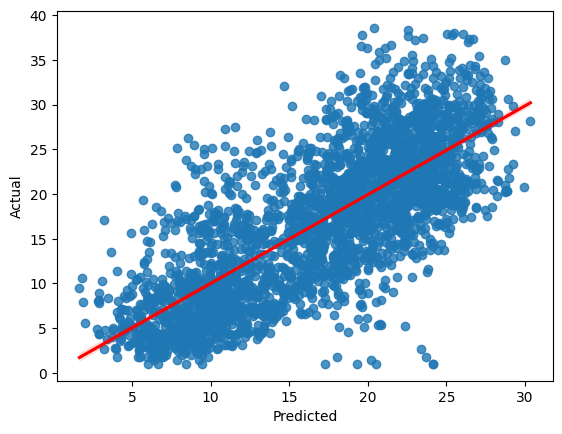

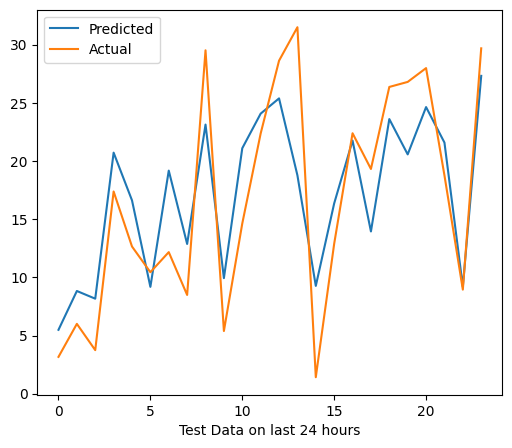

------------------------------------------------------------------------------------------------------------------------------------------------------
               699       796       8797       7271       8232
y_actual   3.162278  6.000000  3.741657  17.378147  12.649111
y_predict  5.488647  8.825561  8.163940  20.715698  16.616089
error     -2.326370 -2.825561 -4.422283  -3.337551  -3.966978
------------------------------------------------------------------------------------------------------------------------------------------------------


In [162]:
predict(LinearRegression(), 'LinearRegression')

### **8.2 Lasso** 

Lasso (Least Absolute Shrinkage and Selection Operator) is a regularization technique used in linear regression models. It helps to reduce the complexity of the model and improve its generalization ability by penalizing the magnitude of coefficients of the features. 

The lasso regularization adds a penalty term to the loss function being optimized. The penalty term is proportional to the absolute magnitude of the coefficients, but unlike ridge regression, it shrinks the coefficients of some features to zero, effectively removing them from the model.

train MSE : 30.361
train RMSE : 5.51
train MAE : 4.373
train R2 : 0.562
train Adj R2 : 0.561
------------------------------------------------------------------------------------------------------------------------------------------------------
test MSE : 30.109
test RMSE : 5.487
test MAE : 4.371
test R2 : 0.566
test Adj R2 : 0.564
------------------------------------------------------------------------------------------------------------------------------------------------------


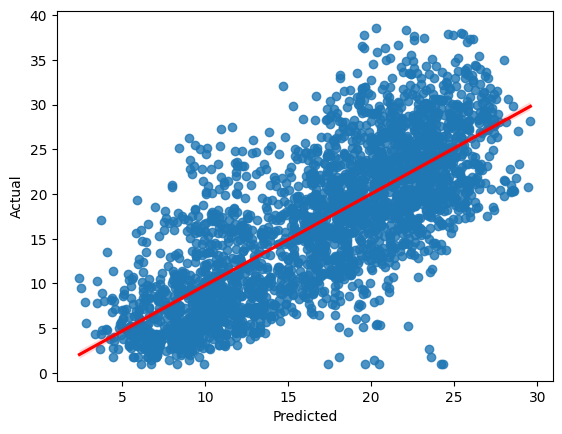

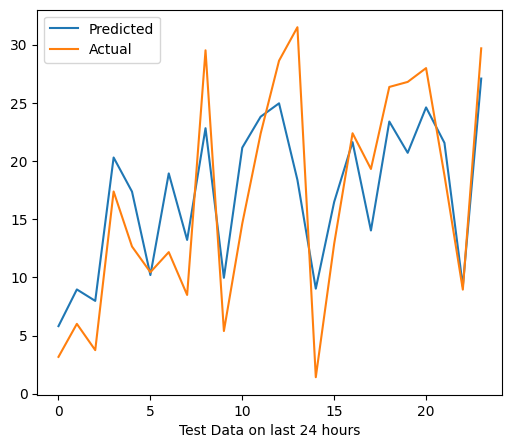

------------------------------------------------------------------------------------------------------------------------------------------------------
               699       796       8797       7271       8232
y_actual   3.162278  6.000000  3.741657  17.378147  12.649111
y_predict  5.805019  8.958441  7.974901  20.298773  17.366059
error     -2.642741 -2.958441 -4.233244  -2.920626  -4.716948
------------------------------------------------------------------------------------------------------------------------------------------------------


In [163]:
predict(Lasso(alpha=0.1, max_iter=1000), 'Lasso')

### **8.3 Ridge**

Ridge Regression is a type of regularized linear regression that aims to solve the problem of multicollinearity and overfitting by adding a penalty term to the loss function. The penalty term is the L2 regularization term (also known as the weight decay term), which adds a penalty proportional to the square of the magnitude of the coefficients.

train MSE : 30.254
train RMSE : 5.5
train MAE : 4.357
train R2 : 0.564
train Adj R2 : 0.563
------------------------------------------------------------------------------------------------------------------------------------------------------
test MSE : 30.074
test RMSE : 5.484
test MAE : 4.36
test R2 : 0.567
test Adj R2 : 0.564
------------------------------------------------------------------------------------------------------------------------------------------------------


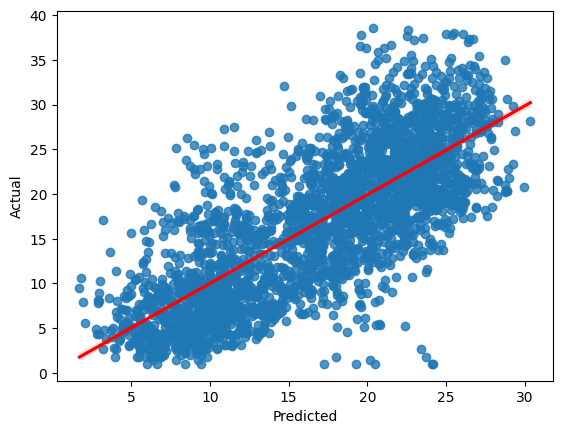

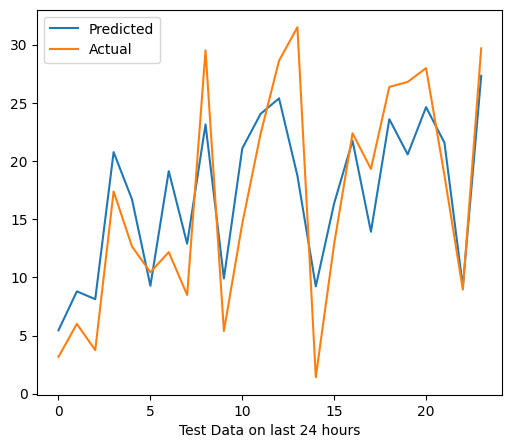

------------------------------------------------------------------------------------------------------------------------------------------------------
               699       796       8797       7271       8232
y_actual   3.162278  6.000000  3.741657  17.378147  12.649111
y_predict  5.446934  8.791677  8.122754  20.761687  16.701878
error     -2.284656 -2.791677 -4.381097  -3.383539  -4.052767
------------------------------------------------------------------------------------------------------------------------------------------------------


In [164]:
predict(Ridge(alpha=0.1, max_iter=1000), 'Ridge')

### **8.4 Elastic Net**

ElasticNet is a linear regression algorithm that combines both L1 (Lasso) and L2 (Ridge) regularization techniques. L1 and L2 regularization are methods used to prevent overfitting by adding penalty terms to the loss function that the algorithm minimizes. Lasso adds a penalty proportional to the absolute value of the coefficients, while Ridge adds a penalty proportional to the square of the coefficients.

train MSE : 30.437
train RMSE : 5.517
train MAE : 4.387
train R2 : 0.561
train Adj R2 : 0.56
------------------------------------------------------------------------------------------------------------------------------------------------------
test MSE : 30.233
test RMSE : 5.498
test MAE : 4.388
test R2 : 0.564
test Adj R2 : 0.562
------------------------------------------------------------------------------------------------------------------------------------------------------


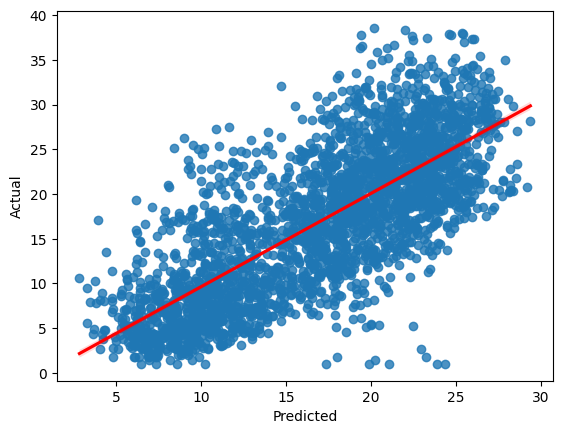

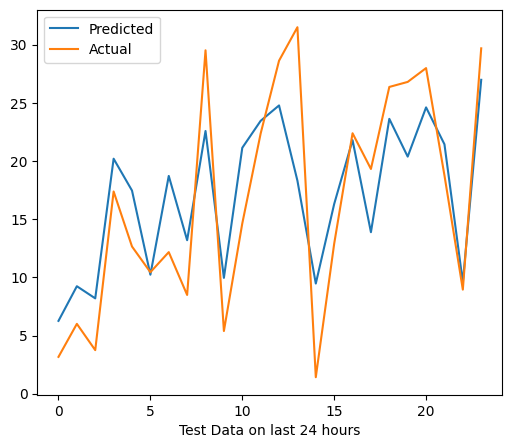

------------------------------------------------------------------------------------------------------------------------------------------------------
               699       796       8797       7271       8232
y_actual   3.162278  6.000000  3.741657  17.378147  12.649111
y_predict  6.256454  9.234949  8.191404  20.194955  17.457564
error     -3.094177 -3.234949 -4.449746  -2.816808  -4.808453
------------------------------------------------------------------------------------------------------------------------------------------------------


In [165]:
predict(ElasticNet(alpha=0.1, max_iter=1000), 'Elastic Net')

### **8.5 K-Nearest Neighbors**

A supervised machine learning algorithm known as KNN or K-nearest neighbor can be used to solve classification and regression problems. K is not a non-parametric nearest neighbor, i.e. It makes no assumptions regarding the assumptions that underlie the data. An input or unseen data set is categorized here by the algorithm based on the characteristics shared by the closest data points. The distance between two points determines these closest neighbors. The distance metric methods that are utilized can be Euclidean Distance, Manhattan Distance, Minkowski, Cosine Similarity Measure etc)

train MSE : 7.985
train RMSE : 2.826
train MAE : 2.026
train R2 : 0.885
train Adj R2 : 0.885
------------------------------------------------------------------------------------------------------------------------------------------------------
test MSE : 15.826
test RMSE : 3.978
test MAE : 2.961
test R2 : 0.772
test Adj R2 : 0.771
------------------------------------------------------------------------------------------------------------------------------------------------------


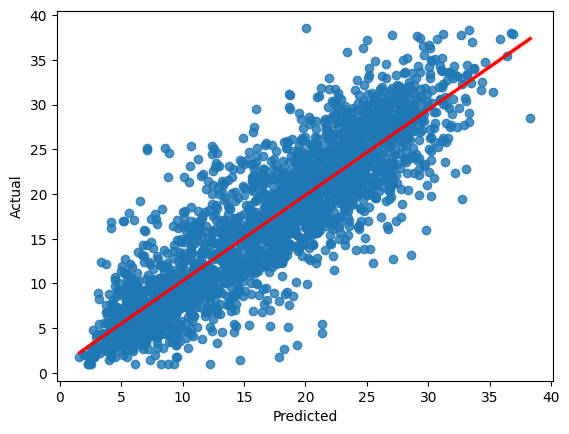

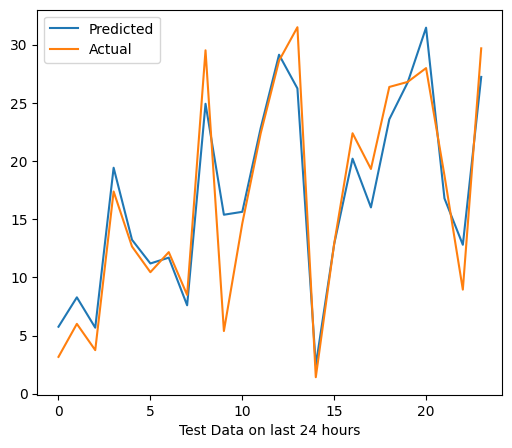

------------------------------------------------------------------------------------------------------------------------------------------------------
               699       796       8797       7271       8232
y_actual   3.162278  6.000000  3.741657  17.378147  12.649111
y_predict  5.753589  8.280021  5.671720  19.419632  13.226449
error     -2.591311 -2.280021 -1.930063  -2.041485  -0.577338
------------------------------------------------------------------------------------------------------------------------------------------------------


In [166]:
predict(KNeighborsRegressor(n_neighbors=3),'KNN')

### **8.6 Support Vector Machine**

Support Vector Machine (SVM) is a popular and powerful machine learning algorithm for classification and regression problems. It is based on the concept of finding the best hyperplane that separates the data into classes, or predicts the target value for regression problems. 

train MSE : 10.515
train RMSE : 3.243
train MAE : 2.036
train R2 : 0.848
train Adj R2 : 0.848
------------------------------------------------------------------------------------------------------------------------------------------------------
test MSE : 11.979
test RMSE : 3.461
test MAE : 2.426
test R2 : 0.827
test Adj R2 : 0.826
------------------------------------------------------------------------------------------------------------------------------------------------------


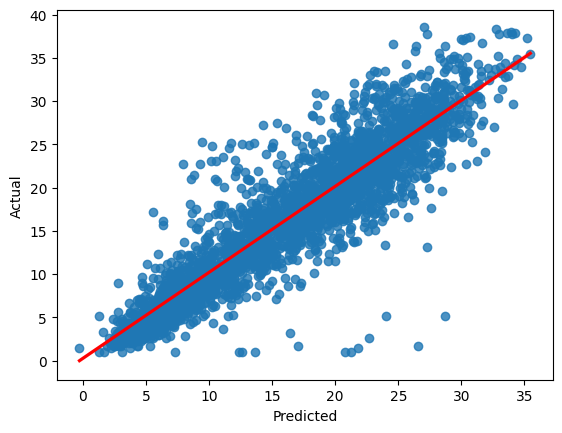

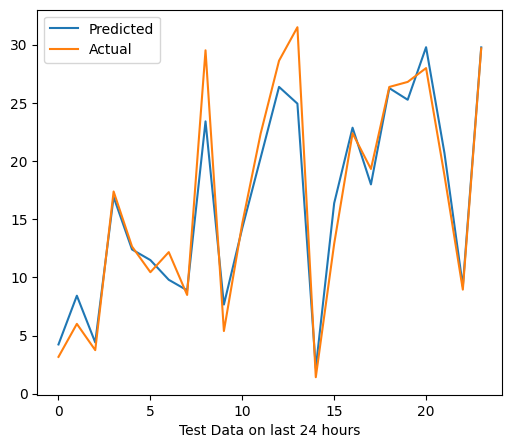

------------------------------------------------------------------------------------------------------------------------------------------------------
               699       796       8797       7271       8232
y_actual   3.162278  6.000000  3.741657  17.378147  12.649111
y_predict  4.231423  8.420228  4.403303  16.907618  12.395351
error     -1.069145 -2.420228 -0.661646   0.470529   0.253760
------------------------------------------------------------------------------------------------------------------------------------------------------


In [167]:
predict(SVR(kernel='rbf',C=100), 'SVM')

### **8.7 Decision Tree**

A decision tree is a tree-like model used in machine learning to make predictions or decisions by breaking down a set of rules or conditions into smaller and smaller sub-conditions, based on the values of the input features.

Each node in the tree represents a test on a feature, and each branch represents the outcome of the test. The final branches of the tree, called the leaves, represent the class predictions or decisions. The tree is built recursively by finding the best feature to split the data based on the information gain or decrease in impurity at each node.

train MSE : 10.345
train RMSE : 3.216
train MAE : 2.327
train R2 : 0.851
train Adj R2 : 0.851
------------------------------------------------------------------------------------------------------------------------------------------------------
test MSE : 13.134
test RMSE : 3.624
test MAE : 2.623
test R2 : 0.811
test Adj R2 : 0.81
------------------------------------------------------------------------------------------------------------------------------------------------------


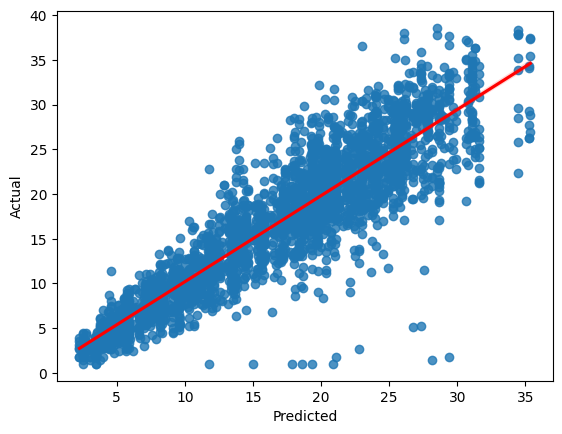

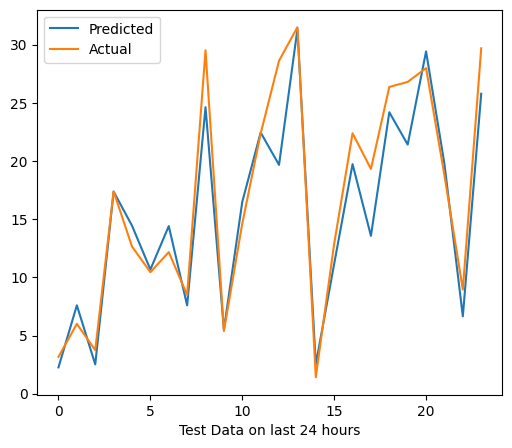

------------------------------------------------------------------------------------------------------------------------------------------------------
               699       796       8797       7271       8232
y_actual   3.162278  6.000000  3.741657  17.378147  12.649111
y_predict  2.262961  7.593644  2.517701  17.370232  14.441450
error      0.899317 -1.593644  1.223957   0.007915  -1.792339
------------------------------------------------------------------------------------------------------------------------------------------------------


In [168]:
predict(DecisionTreeRegressor(min_samples_leaf=20, min_samples_split=3,max_depth=20, random_state=33), 'Decision Tree')

### **8.8 Random Forest**

Random Forest is an ensemble machine learning algorithm that builds multiple decision trees and combines their predictions to make a final classification or regression prediction. In contrast to a single decision tree, Random Forest reduces the risk of overfitting by combining the results of many trees, each built on a different subset of the data.

**Hyperparameter Tunning using GridSearchCV**

In [169]:
param_grid = {'n_estimators': [200],       # number of trees in the ensemble
             'max_depth': [18,20],           # maximum number of levels allowed in each tree.
             'min_samples_split': [10,1],    # minimum number of samples necessary in a node to cause node splitting.
             'min_samples_leaf': [2, 4]}      # minimum number of samples which can be stored in a tree leaf.


# Initialize the RandomForestRegressor model
rf = RandomForestRegressor()

# Use GridSearchCV to perform a grid search over the parameter grid
grid_search = GridSearchCV(rf, param_grid=param_grid, cv=5, scoring='r2')

# Fit the model to the training data
grid_search.fit(X, y)

GridSearchCV(cv=5, estimator=RandomForestRegressor(),
             param_grid={'max_depth': [18, 20], 'min_samples_leaf': [2, 4],
                         'min_samples_split': [10, 1], 'n_estimators': [200]},
             scoring='r2')

In [170]:
# Get the best parameters from the grid search
rf_optimal_model = grid_search.best_estimator_
rf_optimal_model

RandomForestRegressor(max_depth=18, min_samples_leaf=4, min_samples_split=10,
                      n_estimators=200)

train MSE : 4.571
train RMSE : 2.138
train MAE : 1.493
train R2 : 0.934
train Adj R2 : 0.934
------------------------------------------------------------------------------------------------------------------------------------------------------
test MSE : 9.523
test RMSE : 3.086
test MAE : 2.214
test R2 : 0.863
test Adj R2 : 0.862
------------------------------------------------------------------------------------------------------------------------------------------------------


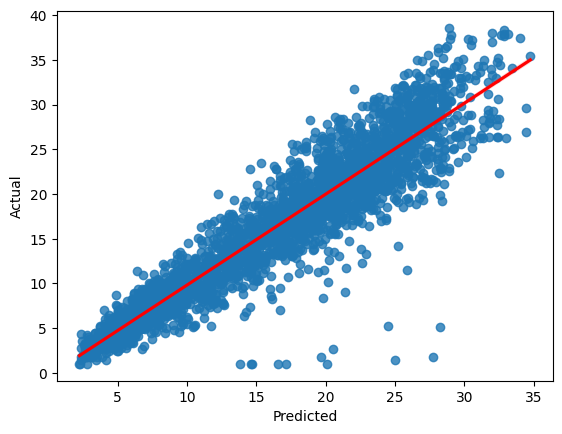

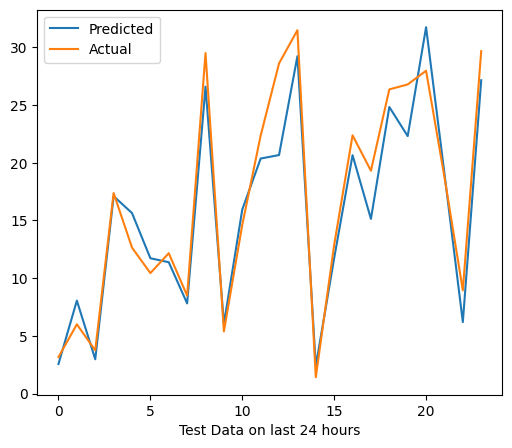

------------------------------------------------------------------------------------------------------------------------------------------------------
               699       796       8797       7271       8232
y_actual   3.162278  6.000000  3.741657  17.378147  12.649111
y_predict  2.563772  8.055417  2.968599  17.107485  15.644410
error      0.598506 -2.055417  0.773059   0.270662  -2.995299
------------------------------------------------------------------------------------------------------------------------------------------------------


In [171]:
predict(rf_optimal_model, 'Random Forest')

### **8.9 AdaBoost**

AdaBoost (Adaptive Boosting) is an ensemble machine learning algorithm that combines multiple weak models to form a stronger model. It works by assigning weights to the data points in a dataset and iteratively building weak models that try to correctly classify or predict the target variable. After each iteration, the weights of the misclassified or mispredicted data points are increased, making it more likely that the next weak model will focus on these points.

train MSE : 2.061
train RMSE : 1.436
train MAE : 1.107
train R2 : 0.97
train Adj R2 : 0.97
------------------------------------------------------------------------------------------------------------------------------------------------------
test MSE : 9.109
test RMSE : 3.018
test MAE : 2.198
test R2 : 0.869
test Adj R2 : 0.868
------------------------------------------------------------------------------------------------------------------------------------------------------


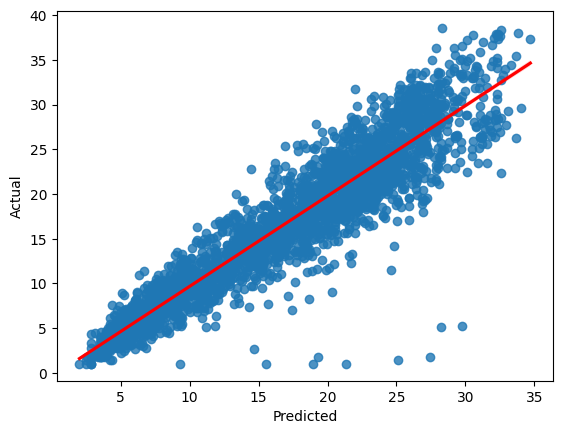

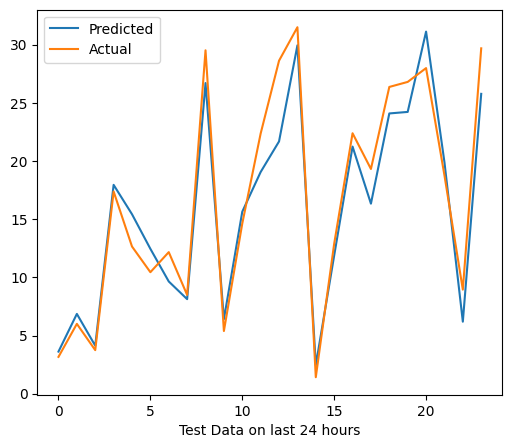

------------------------------------------------------------------------------------------------------------------------------------------------------
               699       796       8797       7271       8232
y_actual   3.162278  6.000000  3.741657  17.378147  12.649111
y_predict  3.616463  6.855655  4.122772  17.947530  15.423963
error     -0.454185 -0.855655 -0.381115  -0.569383  -2.774852
------------------------------------------------------------------------------------------------------------------------------------------------------


In [172]:
# Create a base decision tree regression model
dt = DecisionTreeRegressor(max_depth=12)

# Initialize the AdaBoost regression model
ada = AdaBoostRegressor(estimator=dt, n_estimators=60, learning_rate=1, random_state =33)

# Predict using function
predict(ada, 'AdaBoost')

#### **Model Explainability**

In [173]:
# feature importance 
importances = ada.feature_importances_

# Creating a dictonary 
importance_dict = {'Feature' : list(X.columns),
                   'Feature Importance' : importances}

# Creating the dataframe
importance = pd.DataFrame(importance_dict)
sorting_features = importance.sort_values(by=['Feature Importance'],ascending=False)
sorting_features

,Feature,Feature Importance
9,hour,0.356703
10,temperature,0.132939
8,solar_radiation,0.117554
6,day,0.073007
5,visibility,0.070498
3,humidity,0.065667
0,month,0.049252
2,wind_speed,0.043512
7,wind_direction,0.036862
4,holiday,0.032068


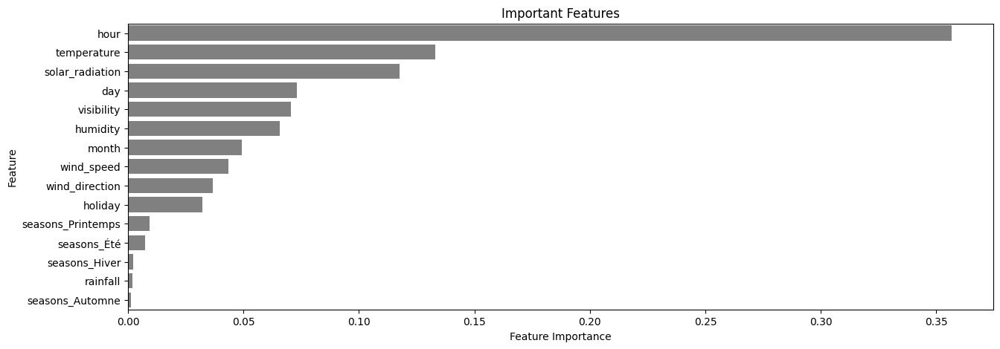

In [174]:
# plotting feature importance graph
plt.figure(figsize=(15,5))
bar = sns.barplot(x='Feature Importance', y='Feature', data=sorting_features, color='grey')
bar.set_title('Important Features')
plt.show()

The top 5 important features in Adaboost are hour, temperature, day, visibility, and month

### **8.10 Xtreme Gradient Boosting**

XGBoost (eXtreme Gradient Boosting) is an optimized implementation of the Gradient Boosting algorithm that is specifically designed for large-scale and complex data. XGBoost is an ensemble learning algorithm that builds multiple decision trees and combines their predictions to make a final prediction.

**HyperParameter Tunning using GridSearchCV**

In [175]:
param_grid = {
    'n_estimators': [300, 400],     # Nombre d'arbres dans l'ensemble
    'max_depth': [7, 8],          # Profondeur maximale des arbres
    'min_samples_split': [2, 3],        # Nombre minimum d'échantillons nécessaires pour diviser un nœud
    'min_samples_leaf': [3, 5],         # Nombre minimum d'échantillons dans une feuille
    'learning_rate': [0.01], # Taux d'apprentissage
    'colsample_bytree': [0.7],  # Fraction des caractéristiques pour chaque arbre
    'gamma': [0.4],              # Régularisation L1 sur les poids des feuilles
}

# Initialize the RandomForestRegressor model
xgb = XGBRegressor()

# Use GridSearchCV to perform a grid search over the parameter grid
grid_search = GridSearchCV(xgb, param_grid=param_grid, cv=5, scoring='r2')

# Fit the model to the training data
grid_search.fit(X, y)

GridSearchCV(cv=5,
             estimator=XGBRegressor(base_score=None, booster=None,
                                    callbacks=None, colsample_bylevel=None,
                                    colsample_bynode=None,
                                    colsample_bytree=None, device=None,
                                    early_stopping_rounds=None,
                                    enable_categorical=False, eval_metric=None,
                                    feature_types=None, gamma=None,
                                    grow_policy=None, importance_type=None,
                                    interaction_constraints=None,
                                    learning_rate=None, m...
                                    max_depth=None, max_leaves=None,
                                    min_child_weight=None, missing=nan,
                                    monotone_constraints=None,
                                    multi_strategy=None, n_estimators=None,
                                    n_jobs=None, num_parallel_tree=None,
                                    random_state=None, ...),
             param_grid={'colsample_bytree': [0.7], 'gamma': [0.4],
                         'learning_rate': [0.01], 'max_depth': [7, 8],
                         'min_samples_leaf': [3, 5],
                         'min_samples_split': [2, 3],
                         'n_estimators': [300, 400]},
             scoring='r2')

In [176]:
# Get the best parameters from the grid search
xgb_optimal_model = grid_search.best_estimator_
xgb_optimal_model

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=0.7, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=0.4, grow_policy=None, importance_type=None,
             interaction_constraints=None, learning_rate=0.01, max_bin=None,
             max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=7, max_leaves=None,
             min_child_weight=None, min_samples_leaf=3, min_samples_split=2,
             missing=nan, monotone_constraints=None, multi_strategy=None,
             n_estimators=300, n_jobs=None, ...)

train MSE : 9.547
train RMSE : 3.09
train MAE : 2.321
train R2 : 0.862
train Adj R2 : 0.862
------------------------------------------------------------------------------------------------------------------------------------------------------
test MSE : 10.988
test RMSE : 3.315
test MAE : 2.52
test R2 : 0.842
test Adj R2 : 0.841
------------------------------------------------------------------------------------------------------------------------------------------------------


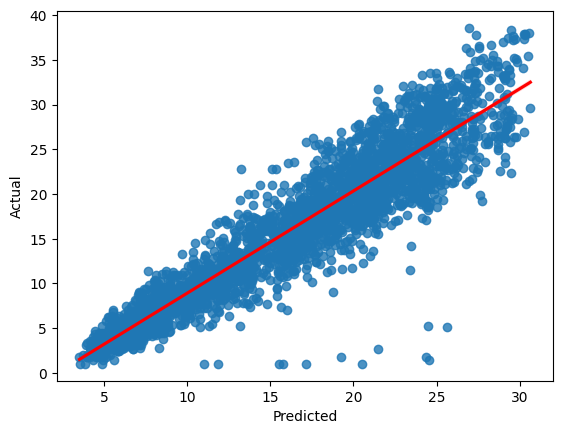

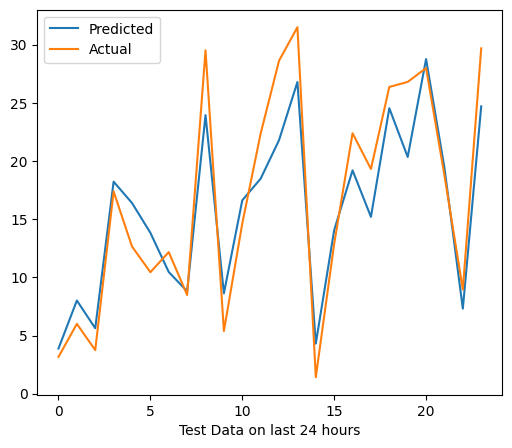

------------------------------------------------------------------------------------------------------------------------------------------------------
               699       796       8797       7271       8232
y_actual   3.162278  6.000000  3.741657  17.378147  12.649111
y_predict  3.880750  8.007604  5.622188  18.218967  16.389576
error     -0.718472 -2.007604 -1.880531  -0.840820  -3.740465
------------------------------------------------------------------------------------------------------------------------------------------------------


In [177]:
predict(xgb_optimal_model, 'XGB')

#### **Model Explainability**

In [178]:
# feature importance 
importances = xgb_optimal_model.feature_importances_

# Creating a dictonary 
importance_dict = {'Feature' : list(X.columns),
                   'Feature Importance' : importances}

# Creating the dataframe
importance = pd.DataFrame(importance_dict)
sorting_features = importance.sort_values(by=['Feature Importance'],ascending=False)
sorting_features

,Feature,Feature Importance
9,hour,0.361644
8,solar_radiation,0.145914
4,holiday,0.089263
10,temperature,0.084670
12,seasons_Hiver,0.083544
14,seasons_Été,0.041185
0,month,0.039843
11,seasons_Automne,0.034715
13,seasons_Printemps,0.032484
3,humidity,0.018469


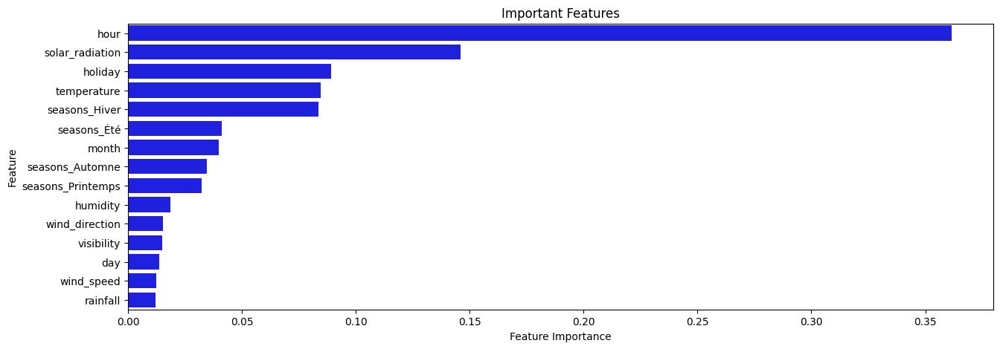

In [179]:
# plotting feature importance graph
plt.figure(figsize=(15,5))
bar = sns.barplot(x='Feature Importance', y='Feature', data=sorting_features, color='blue')
bar.set_title('Important Features')
plt.show()

The top 5 important features in XGB Model are hour, school_day, solar_radiation, seasons_winter, and season_autumn

### **8.11 Light GBM**

LightGBM is a gradient boosting framework that uses tree-based learning algorithms. It is designed to be more efficient than traditional gradient boosting algorithms and is particularly well-suited for large datasets.LightGBM is an open-source library that was developed by Microsoft. 

One of the key features of LightGBM is its use of a histogram-based approach to split nodes in decision trees. 

**HyperParameter Tunning using GridSearchCV**

In [180]:
param_grid = {
    'n_estimators': [500, 600],        # nombre d'arbres dans l'ensemble
    'max_depth': [10, 12],                 # profondeur maximale des arbres
    'min_data_in_leaf': [4, 5],              # nombre minimum d'échantillons dans une feuille
    'subsample': [0.6, 0.8],            # fraction des échantillons utilisés pour la formation de chaque arbre
    'reg_alpha': [0.05],        # terme de régularisation L1
    'reg_lambda': [0.05],         # terme de régularisation L2
    'num_leaves': [31, 63]              # nombre de feuilles dans chaque arbre
}

# 'min_child_samples': [30, 34],       # nombre minimum d'échantillons dans une feuille après la division 
# Initialiser le modèle LGBMRegressor
lgb = LGBMRegressor()

# Use GridSearchCV to perform a grid search over the parameter grid
#random_search = RandomizedSearchCV(lgb, param_distributions=param_dist, n_iter=50, cv=3, scoring='r2', random_state=42)
grid_search = GridSearchCV(lgb, param_grid=param_grid, cv=5, scoring='r2')

# Ajuster le modèle aux données d'entraînement
grid_search.fit(X, y)

[LightGBM] [Warning] min_data_in_leaf is set=4, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] min_data_in_leaf is set=4, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000659 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1050
[LightGBM] [Info] Number of data points in the train set: 11023, number of used features: 15
[LightGBM] [Info] Start training from score 18.046369
[LightGBM] [Warning] min_data_in_leaf is set=4, min_child_samples=20 will be ignored. Current

GridSearchCV(cv=5, estimator=LGBMRegressor(),
             param_grid={'max_depth': [10, 12], 'min_data_in_leaf': [4, 5],
                         'n_estimators': [500, 600], 'num_leaves': [31, 63],
                         'reg_alpha': [0.05], 'reg_lambda': [0.05],
                         'subsample': [0.6, 0.8]},
             scoring='r2')

In [181]:
# Get the best parameters from the grid search
lgb_optimal_model = grid_search.best_estimator_
lgb_optimal_model

LGBMRegressor(max_depth=12, min_data_in_leaf=4, n_estimators=500,
              reg_alpha=0.05, reg_lambda=0.05, subsample=0.6)

[LightGBM] [Warning] min_data_in_leaf is set=4, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] min_data_in_leaf is set=4, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001448 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1061
[LightGBM] [Info] Number of data points in the train set: 11023, number of used features: 15
[LightGBM] [Info] Start training from score 17.078417
[LightGBM] [Warning] min_data_in_leaf is set=4, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=4
[LightGBM] [Warning] Accuracy may be 

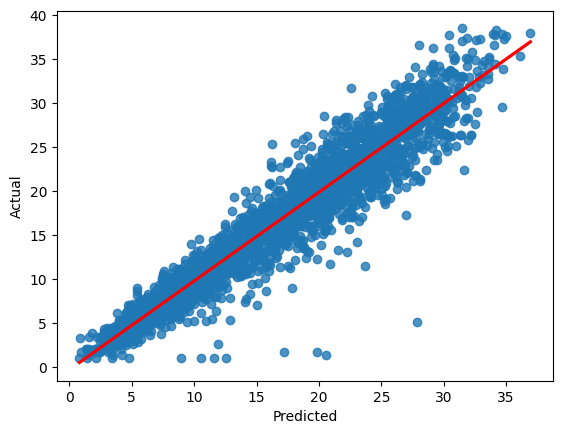

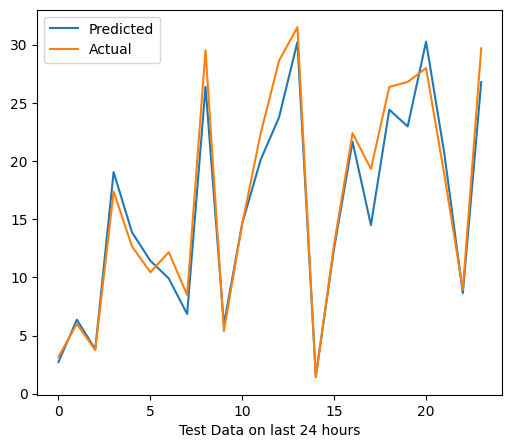

------------------------------------------------------------------------------------------------------------------------------------------------------
               699       796       8797       7271       8232
y_actual   3.162278  6.000000  3.741657  17.378147  12.649111
y_predict  2.723646  6.360876  3.814576  19.045493  13.867084
error      0.438631 -0.360876 -0.072919  -1.667345  -1.217973
------------------------------------------------------------------------------------------------------------------------------------------------------


In [182]:
predict(lgb_optimal_model, 'LGB')

#### **Model Explainability**

In [183]:
# feature importance 
importances = lgb_optimal_model.feature_importances_

#Creating a dictonary 
importance_dict = {'Feature' : list(X.columns),
                   'Feature Importance' : importances}

#Creating the dataframe
importance = pd.DataFrame(importance_dict)
sorting_features = importance.sort_values(by=['Feature Importance'],ascending=False)
sorting_features

,Feature,Feature Importance
6,day,2288
10,temperature,2234
5,visibility,1743
3,humidity,1721
9,hour,1560
0,month,1278
2,wind_speed,1143
7,wind_direction,1050
8,solar_radiation,1032
4,holiday,489


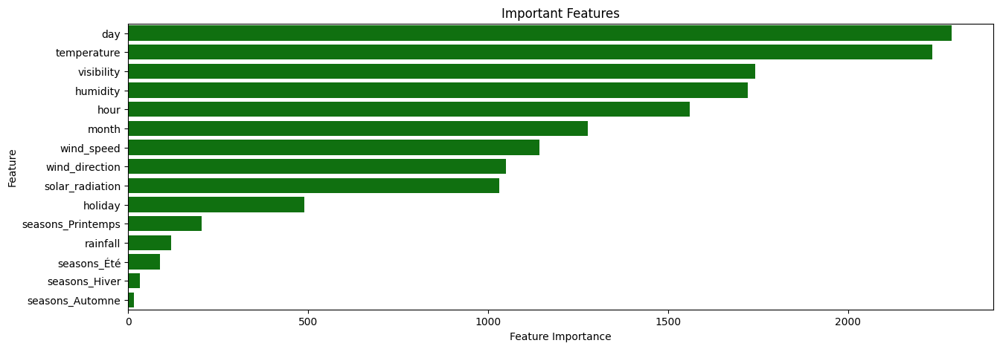

In [184]:
# plotting feature importance graph
plt.figure(figsize=(15,5))
bar=sns.barplot(x='Feature Importance', y='Feature', data=sorting_features, color='green')
bar.set_title('Important Features')
plt.show()

The top 5 important features in XGB Model are temperature, day, visibility, humidity, and hour.

### **8.12 Model Result**

The fit of the model to the dependent variables can be evaluated using the R square measure. On the other hand, overfitting is not taken into consideration. If there are a lot of independent variables in the regression model, it may work well with training data but fail with testing data because it is too complicated. Adjusted R Square is a new metric that penalizes additional independent variables added to the model and adjusts the metric to prevent overfitting.

Because it estimates the relationship between the movements of a dependent variable and those of an independent variable, R square is the best evaluation method for predicting the rented_bike_count. 

In [185]:
# converting the model_result list into DataFrame
model_result = pd.DataFrame(model_result)

# sorting the values by test R2 score
model_result.sort_values(by='test R2', ascending=False)

,model,train MSE,test MSE,train RMSE,test RMSE,train MAE,test MAE,train R2,test R2,train Adj R2,test Adj R2
10,LGB,1.585,5.909,1.259,2.431,0.939,1.721,0.977,0.915,0.977,0.914
8,AdaBoost,2.061,9.109,1.436,3.018,1.107,2.198,0.970,0.869,0.970,0.868
7,Random Forest,4.571,9.523,2.138,3.086,1.493,2.214,0.934,0.863,0.934,0.862
9,XGB,9.547,10.988,3.090,3.315,2.321,2.520,0.862,0.842,0.862,0.841
5,SVM,10.515,11.979,3.243,3.461,2.036,2.426,0.848,0.827,0.848,0.826
6,Decision Tree,10.345,13.134,3.216,3.624,2.327,2.623,0.851,0.811,0.851,0.810
4,KNN,7.985,15.826,2.826,3.978,2.026,2.961,0.885,0.772,0.885,0.771
0,LinearRegression,30.254,30.075,5.500,5.484,4.358,4.360,0.564,0.567,0.563,0.564
2,Ridge,30.254,30.074,5.500,5.484,4.357,4.360,0.564,0.567,0.563,0.564
1,Lasso,30.361,30.109,5.510,5.487,4.373,4.371,0.562,0.566,0.561,0.564


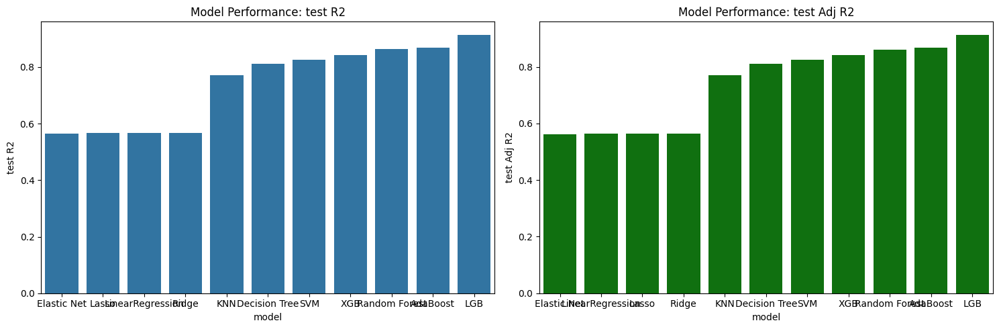

In [186]:
# plotting graph to compare model performance of all the models
model_result_sorted_r2 = model_result.sort_values(by='test R2', ascending=True)
model_result_sorted_adj_r2 = model_result.sort_values(by='test Adj R2', ascending=True)

fig, ax = plt.subplots(1, 2, figsize=(15, 5))

# Models Vs (test R2)
sns.barplot(x=model_result_sorted_r2['model'], y=model_result_sorted_r2['test R2'], ax=ax[0])
ax[0].set_title('Model Performance: test R2')
ax[0].set_xlabel('model')
ax[0].set_ylabel('test R2')

# Models Vs (test Adj R2)
sns.barplot(x=model_result_sorted_adj_r2['model'], y=model_result_sorted_adj_r2['test Adj R2'], ax=ax[1], color='green')
ax[1].set_title('Model Performance: test Adj R2')
ax[1].set_xlabel('model')
ax[1].set_ylabel('test Adj R2')

plt.tight_layout()
plt.show()

**From the above result, we can select Adaboost or LGB Regressor as the final model because it has the lowest RMSE value as well as the highest R2 score on the test data. I would go with LGB because it is considered a better model for large dataset and it is explaining the features which it is taking into account in better manner.**

## **9. Conclusion**

### **Summary**

We began our analysis by performing EDA on all of our datasets. First, we looked at and changed our dependent variable, "Rental Bike Count." After that, we looked at categorical variables and numerical variables and discovered their correlation, distribution, and connection to the dependent variable. Additionally, we hot-encoded the categorical variables and removed some numerical features which are used only for EDA purposes and have multi-collinearity.

Following that, we examine several well-known individual models, ranging from straightforward Linear Regression and Regularization Models (Ridge, Lasso, and Elastic Net) to more complex and ensemble models like Random Forest, Gradient Boost, and Light GBM. To enhance the performance of our model, we performed hyperparameter tuning.

## **Conclusion**

saving LGBM model

In [187]:
# Sauvegarde du modèle
model_save_path = r'C:\Users\39812\OneDrive - Aix Marseille Provence Métropole\Documents\Bike Project\Datasets\lgb_optimal_model.pkl'

joblib.dump(lgb_optimal_model, model_save_path)

['C:\\Users\\39812\\OneDrive - Aix Marseille Provence Métropole\\Documents\\Bike Project\\Datasets\\lgb_optimal_model.pkl']

In [188]:
# Sauvegarde 'scaler'processeurs StandardScaler utilisé pour prétraiter les données
scaler_save_path = r'C:\Users\39812\OneDrive - Aix Marseille Provence Métropole\Documents\Bike Project\Datasets\scaler.pkl'
joblib.dump(scaler, scaler_save_path)

['C:\\Users\\39812\\OneDrive - Aix Marseille Provence Métropole\\Documents\\Bike Project\\Datasets\\scaler.pkl']